# Statistical comparison of metagenomics softwares for taxonomic classification
### There is a wide variety of softwares and providers available for the measurement of taxonomic identities and relative abundances of microorganisms from shotgun sequence samples. In this study we compare the performance of Cosmos, FOCUS, Kraken2, MetPhlAn3, and mOTUs metagenomic classifiers.
### The evaluation of the above-mentioned softwares was performed on a 103 samples, the database consists of csv files cointaining relative abundace values assigned to taxonomic identifiers measured by each taxonomic classifier
##### 1st column/index column: 'Tax ID' - unique identifiers asssinged by the NCBI to organisms
##### 2nd-6th column: 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetPhlAn3', 'Motus - realative abundances of organisms in the sample

In [22]:
!sudo apt -y update && sudo apt -y install software-properties-common && DEBIAN_FRONTEND=noninteractive sudo -E add-apt-repository -y ppa:deadsnakes/ppa && sudo apt -y update && sudo apt -y upgrade && sudo apt -y install build-essential autoconf automake m4 python3 libpython3-dev python3-pip python3-distutils

Hit:1 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:2 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease   
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease                         
Hit:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
All packages are up to date.
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
software-properties-common is already the newest version (0.99.22.3).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.
Repository: 'deb https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu/ jammy main'
Description:
This PPA contains more recent Python versions packaged for Ubuntu.

Disclaimer: there's no guarantee of timely updates in case of security problems or other issues. If you want to use them in a

In [50]:
!python3 -m pip install wheel setuptools numpy scipy> statsmodels pandas scikit-learn matplotlib networkx seaborn ete3

In [51]:
import pandas as pd
import numpy as np
import os
from pathlib import Path
from ete3 import NCBITaxa
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist
from itertools import combinations
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import networkx as nx


#### Define alpha-diversity indexes

In [1]:
def shannon(x, base=2):
    x = np.asarray(x)
    x = x[x > 0]
    x = x / x.sum()
    return -np.sum(x * np.log(x)) / np.log(base)

def simpson(x):
    x = np.asarray(x)
    x = x[x > 0]
    x = x / x.sum()
    return 1 / np.sum(x * x)

#### Visualization helper

In [ ]:
def show_or_generate(mode, format='pdf'):
    if mode == 'interactive':
        plt.show()
        return None
    else:
        buf = BytesIO()
        plt.save(buf, format=format)
        return buf

##### Function for calculating and visualizing correaltions

In [55]:
from io import BytesIO

def visualize_corr(df, title, mode='interactive', format='pdf'): # mode is either 'interactive' or 'save'
    corr = df.corr()
    
    plt.close()
    fig = plt.figure()
    ax = fig.add_subplot()
    cax = ax.matshow(corr, vmin=-1, vmax=1, cmap='coolwarm')
    for (i, j), z in np.ndenumerate(corr):
             ax.text(j, i, '{:0.2f}'.format(z), ha='center', va='center')
    fig.colorbar(cax)
    ticks = np.arange(0, len(corr.columns), 1)
    ax.set_xticks(ticks)
    plt.xticks(rotation=90)
    ax.set_yticks(ticks)
    ax.set_xticklabels(corr.columns)
    ax.set_yticklabels(corr.columns)
    plt.title(title)
    
    corrbuf = show_or_generate(mode, format)
        
    G = nx.Graph()
    for (i, j), p in np.ndenumerate(corr):
        G.add_edge(corr.columns[i], corr.columns[j], weight=np.round(p, 3)) if i!=j else None
    weights = nx.get_edge_attributes(G,'weight')
    
    plt.close()
    pos = nx.circular_layout(G)
    nx.draw(G, pos, width=[p*10 for p in weights.values()], edge_cmap=plt.cm.coolwarm, edge_vmax=1, edge_vmin=-1, 
            edge_color=weights.values(), node_size=3500, node_color='whitesmoke', with_labels=True, font_size=10, edgecolors='darkgrey')
    nx.draw_networkx_edge_labels(G, pos, weights)
    
    graphbuf = show_or_generate(mode, format)

    plt.close()
    plt.figure(figsize = (6, 3))
    ax = plt.subplot()
    average_corr = [(corr[col].sum()-1)/4 for col in corr.columns]
    bar = ax.bar(corr.columns, average_corr)
    colormap = plt.cm.coolwarm
    normalize_color = mcolors.Normalize(vmin=-1, vmax=1)
    for i, v in enumerate(average_corr):
        ax.text(i-0.15, v, str(np.round(v, 2)))
        bar[i].set_color(colormap(normalize_color(bar[i].get_height())))
    plt.title('Mean of correlation coefficients')
    
    avgbuf = show_or_generate(mode, format)
    
    return average_corr, {
        'matrix': corrbuf,
        'graph': graphbuf,
        'averages': avgbuf,
    }

## Determining the most commonly detected Tax IDs in all samples at each taxonomic rank.

#### The 5 software combined typically identify between 1000 and 2000 taxa in every sample, however, the vast majority of them are not recognized by all the classifiers.  Firstly we determine how often each organism (Tax ID) has been detected, as well as how many of the 5 software have been able to recognise it.

In [3]:
df_lenghts=[len(pd.read_csv(Path('data')/file, usecols=['Tax ID'])) for file in os.listdir('data')]
print('Average number of Tax IDs identified in a sample (all classifiers combined):',sum(df_lenghts)/len(df_lenghts))

Average number of Tax IDs identified in a sample (all classifiers combined): 1388.116504854369


In [57]:
taxids = []
for file in os.listdir('data'):
    df = pd.read_csv(Path('data')/file, usecols=['Tax ID'])
    taxids = list(set(taxids + list(df['Tax ID'])))
df_top_taxids = pd.DataFrame(taxids, columns=['Tax ID'])
df_top_taxids.dropna(inplace=True)
df_top_taxids['samples'] = 0
df_top_taxids['values'] = 0
for file in os.listdir('data'):
    df = pd.read_csv(Path('data') / file)
    df = df[df['Tax ID'].notna()]
#     print(df.duplicated(['Tax ID']).sum())
    if df.duplicated(['Tax ID']).sum() != 0:
        print(df[df.duplicated(['Tax ID'], keep=False)])
        print(file)
    for index, row in df.iterrows():
        out_index = df_top_taxids.index[df_top_taxids['Tax ID'] == row['Tax ID']][0]
        df_top_taxids.at[out_index, 'samples'] += 1
        df_top_taxids.at[out_index, 'values'] += (row.notnull().sum() - 1)

ncbi = NCBITaxa()
ranks = ncbi.get_rank(df_top_taxids["Tax ID"])
df_top_taxids['rank'] = np.nan
for key, value in ranks.items():
    i = df_top_taxids.index[df_top_taxids['Tax ID'] == str(key)][0]
    df_top_taxids.at[i, 'rank'] = str(value)
df_top_taxids.set_index('Tax ID', inplace=True)
df_top_taxids.sort_values(by=['values'], inplace=True, ascending=False)
df_top_taxids['value/sample'] = df_top_taxids['values'] / df_top_taxids['samples']
# df_top_taxids.to_csv('top_taxids.csv')
# writer = pd.ExcelWriter('top_taxids_by_rank.xlsx', engine='xlsxwriter')
# for level in [x for _, x in df_top_taxids.groupby('rank')]:
#     level.to_excel(writer, sheet_name=level['rank'][0])
# writer.save()


FileNotFoundError: [Errno 2] No such file or directory: 'data'

### The following table presents the list of most commonly detected Tax IDs. 
##### 'Tax ID' - Taxonomic identifier (taxa)
##### 'samples' - number of samples in which the taxon was identified by at least one of the classifiers (max. 103)
##### 'values' - number of relative abundance values assigned to this taxon across all samples (max 103*5=515)
##### 'rank' - taxonomic rank of taxon
##### 'value/sample' -averge number of softwares the taxon was detected by.

In [5]:
df_top_taxids.head(20)

,samples,values,rank,value/sample
Tax ID,,,,
1239,103,515,phylum,5.000000
2,103,515,superkingdom,5.000000
186801,103,512,class,4.970874
186802,103,512,order,4.970874
1224,103,511,phylum,4.961165
976,103,510,phylum,4.951456
200643,103,507,class,4.922330
171549,103,507,order,4.922330
186803,103,504,family,4.893204


### There were 5713 taxa identified in total and a staggering 4501 of those were never detected by more than one software at once in any sample.

In [6]:
print('number of tax ids:', len(df_top_taxids))

number of tax ids: 5713


In [7]:
print(f'number of tax ids that were only detected by one classifier: {len(df_top_taxids[df_top_taxids["value/sample"] == 1])}')


number of tax ids that were only detected by one classifier: 4501


### The averge number of classifier a taxon was detected by decreases drastically, with the number of tax ids that were on average detected by at least 4 classifier being only 33.
#### Detected by at 2 classifier on averge: 304
#### Detected by at 3 classifier on averge: 123
#### Detected by at 4 classifier on averge: 33


In [8]:
for i in range(3):
    print(f'number of tax ids that were on average detected by at least {i+2} classifier: {len(df_top_taxids[df_top_taxids["value/sample"] > i+2])}')



number of tax ids that were on average detected by at least 2 classifier: 304
number of tax ids that were on average detected by at least 3 classifier: 123
number of tax ids that were on average detected by at least 4 classifier: 33


### We expect to see the value/sample values to be differen

In [58]:
for _, level in df_top_taxids.groupby('rank'):
    print(level)

NameError: name 'df_top_taxids' is not defined

## Calculate centered log ratio transforamtion for each software's output

### In addition to the raw relative abundances, as they cannot be interpreted by themselves, we must carry out centered log ratio transformation on each metagenomic classifiers output. After the CLR transformation and standardization the more robust data can be used to calculate correlations between the softwares and do principal component analysis.

In [10]:
for software in ['Cosmos', 'KRAKEN2', 'FOCUS', 'MetaPhlAn3', 'Motus']:
    df_out = pd.DataFrame(columns=['Tax ID'])
    for file in os.listdir('data'):
        df = pd.read_csv(Path('data')/file)
        df = df[['Tax ID', software]]
        df.dropna(inplace=True)
        df.rename(columns={software: file}, inplace=True)
        df_out = df_out.merge(df, on='Tax ID', how='outer')
#     print(f'\n\n{software} outputs:\n{df_out.head()}\n\n')

    for col in df_out.columns:
        if col != 'Tax ID':
            min_value = df_out[col].min()/np.e
            df_out[col].fillna(value=min_value, inplace=True)
            df_out[col] = df_out[col].div(df_out[col].sum())

            mean = df_out[col].mean()
            df_out[col] = np.log(df_out[col].div(mean))

            df_out[col] = (df_out[col] - df_out[col].mean()) / df_out[col].std()

    df_out = df_out.set_index('Tax ID').T
    print(software, df_out.head(10))
#     df_out.to_csv(f'{software}_clr_standardized.csv')

Cosmos Tax ID                            2      1239       976      1224    201174  \
10_MET_NR_0061.csv         4.795566  4.552117  4.273158  3.179593  2.287271   
11_MET_NR_0101.csv         4.711385  4.361030  4.359785  2.845909  2.826149   
12_MET_NR_0010.csv         4.904666  4.528887  4.545937  2.695324  3.004123   
13_MET_NR_0114.csv         4.741725  4.396854  4.346675  3.008153  2.781003   
14_MET_NR_0115.csv         5.067782  4.584657  4.764735  3.236028  3.208993   
15_MET_DPV_IBD_012_SQ.csv  4.951233  4.670918  4.390770  3.231996  3.777152   
16_MET_DPV_IBD_005_SQ.csv  4.908002  4.404616  4.569027  2.907196  3.552531   
17_MET_DPV_IBD_014_SQ.csv  5.557366  4.998329  5.202838  3.413517  4.198700   
18_MET_DPV_IBD_017_SQ.csv  6.427571  5.242749  6.297988  4.494221  1.006573   
19_MET_DPV_IBD_010_SQ.csv  6.042247  5.867176  4.990779  3.387268  3.987923   

Tax ID                       256845     74201    186801    200643    909932  \
10_MET_NR_0061.csv         1.865864  0.50473

## Correlations between softwares

### The CLR transformed data is suitable for calculating correlations between the softwares. For this we average the values along the dimension of sampels, leaving us with a table containing all Tax IDs and the corresponding average values for each classifier. 

### average in clr space across samples

In [11]:
df_average = pd.DataFrame(columns=['Tax ID'])
for file in os.listdir():
    if 'clr_standard' in file:
        df = pd.read_csv(file, index_col=0)
        df_mean = pd.DataFrame()
        df_mean['Tax ID'] = df.columns
        df_mean[f'{file.split("_")[0]}'] = [df[col].mean() for col in df.columns]
        df_average = df_average.merge(df_mean, on='Tax ID', how='outer')
df_average.set_index('Tax ID')
df_average.head(10)
# df_average.to_csv('average_clr_on_samples.csv')

,Tax ID,Cosmos,FOCUS,KRAKEN2,MetaPhlAn3,Motus
0,2,5.358749,4.627515,6.059824,3.700226,4.529251
1,1239,4.941879,4.107117,5.356753,3.285002,4.167044
2,976,4.674369,3.768982,5.372239,3.304118,3.806741
3,1224,3.198469,3.322715,4.134026,1.948065,2.729179
4,201174,3.127227,1.938883,3.796486,2.405671,2.450347
5,256845,0.679393,NaN,NaN,-0.192493,0.101624
6,74201,1.627320,0.400312,1.563558,0.623001,0.685213
7,186801,4.727916,4.052074,5.196256,3.211609,4.029683
8,200643,4.674282,3.639165,5.356436,3.304118,3.806344
9,909932,2.785809,1.074148,2.829755,1.993537,2.298161


### The following figures visualize the correlation between the averaged clr values assigned to taxas by each calssifier.

In [56]:
df = df_average.drop(['Tax ID'], axis = 1) 
visualize_corr(df, 'Correlation of average clr values');

NameError: name 'df_average' is not defined

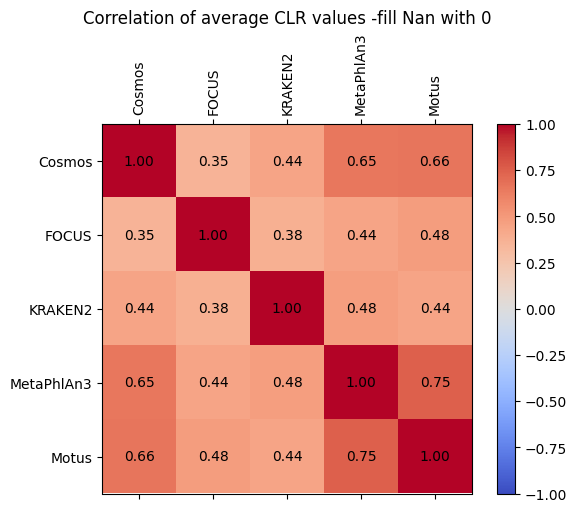

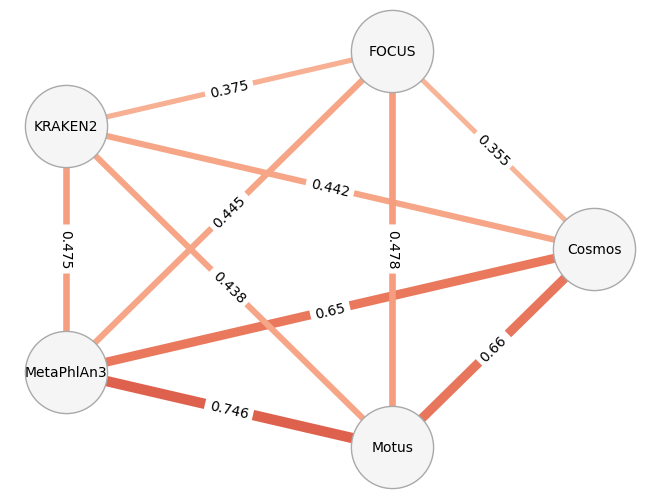

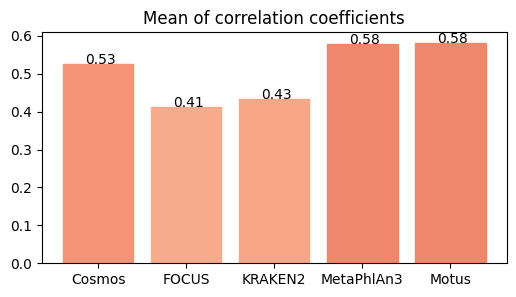

In [13]:
df = df_average.drop(['Tax ID'], axis = 1)
visualize_corr(df.fillna(0), 'Correlation of average CLR values -fill Nan with 0');

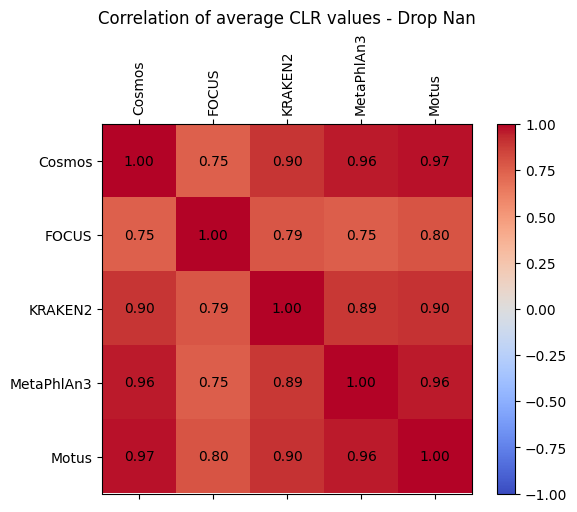

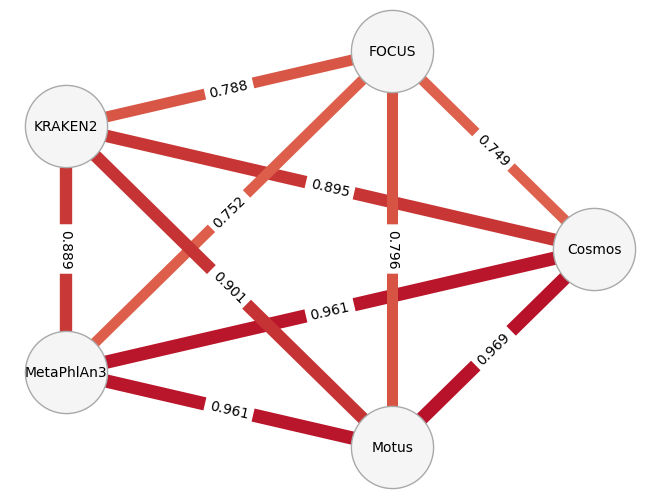

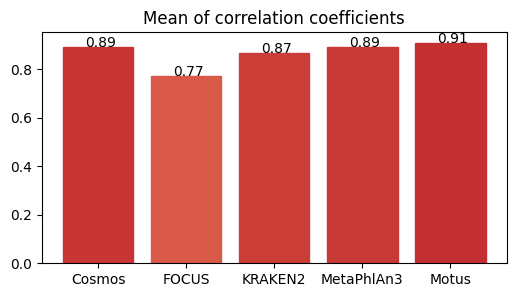

In [14]:
df = df_average.drop(['Tax ID'], axis = 1)
visualize_corr(df.dropna(), 'Correlation of average CLR values - Drop Nan');

## Correlation of softwares at each taxonomic rank in clr space

In [15]:
df_average.shape

(5713, 6)

### The averaged clr database consists of 5713 rows, although we have seen previously that the majority (4501) of taxa have only ever been identified by a single classifier. 
### It is of strong interest to compare the classifiers ability to identify taxa and quantify their abundance on each taxonomic level. We wish to determine how the discrepancy of predictions change as the impact of noise increases in the lower taxonomic levels.

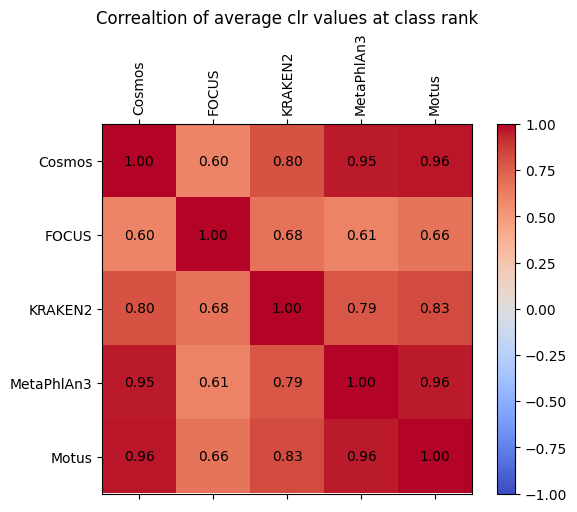

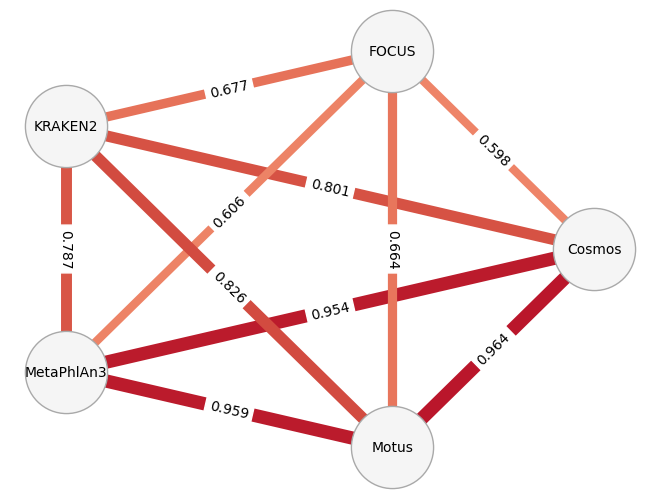

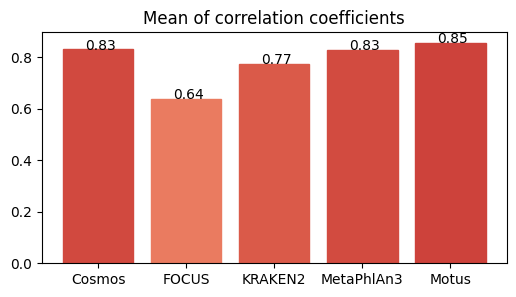

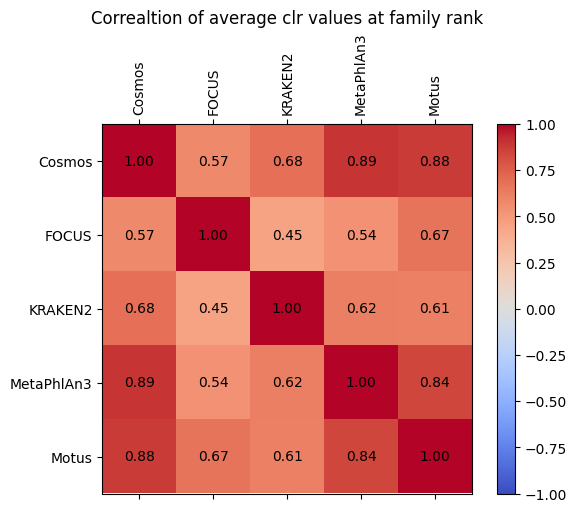

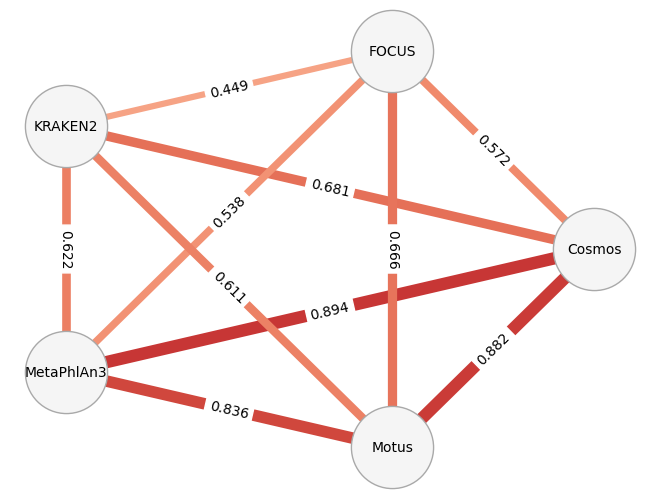

...

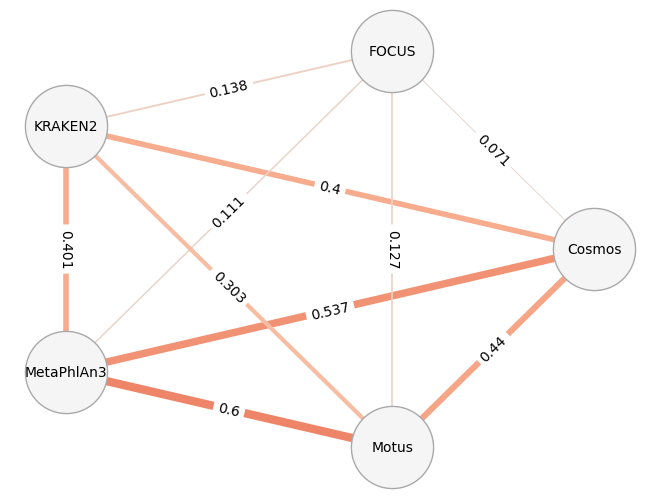

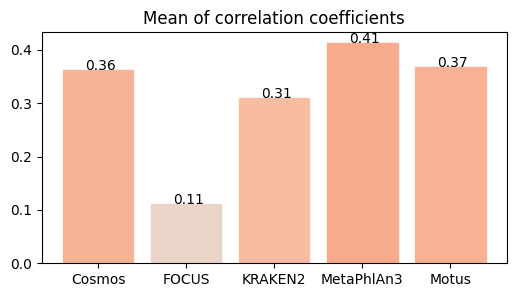

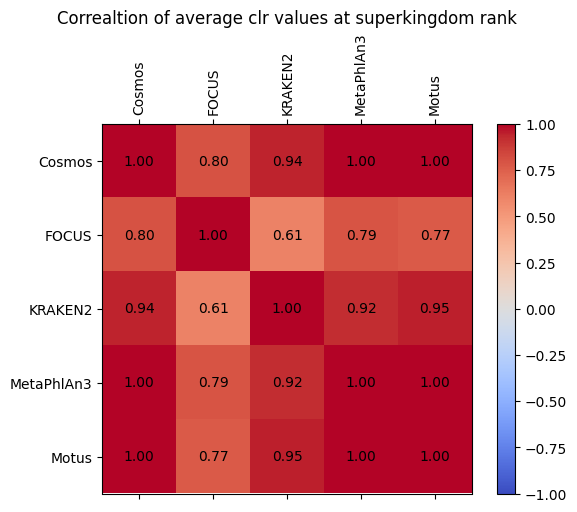

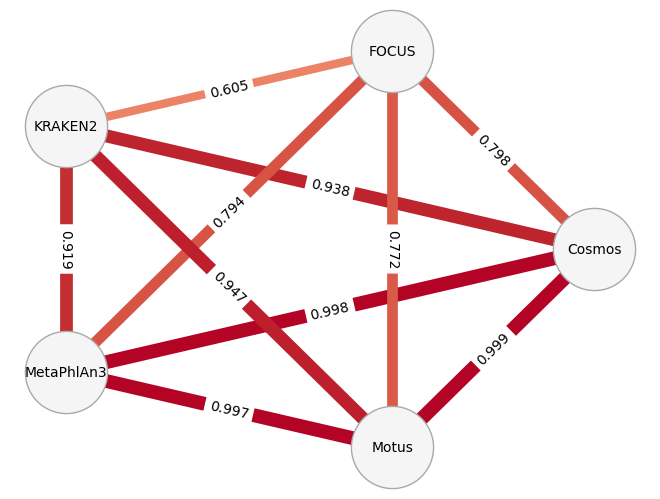

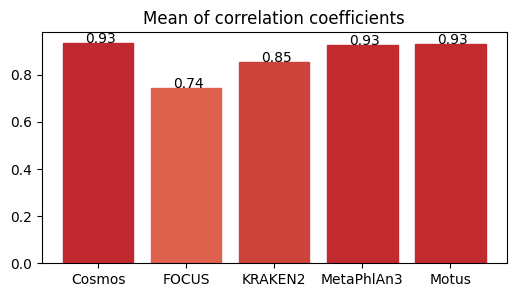

In [16]:
mean_of_coeffs_byrank = {}
for rank in df_top_taxids.groupby('rank'):
    if rank[0] in ['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']:
        df = df_average[df_average['Tax ID'].isin(rank[1].index)]
        mean_of_corr_coeffs = visualize_corr(df.fillna(0), f'Correaltion of average clr values at {rank[0]} rank')
        mean_of_coeffs_byrank[rank[0]] = sum(mean_of_corr_coeffs)/len(mean_of_corr_coeffs)

### The correaltion coefficients on avergaed clr values at each taxonomic rank can be averaged to create a metric describing the mean correlation at every level.  As anticipated the lower the taxonomic level the lower this value is.

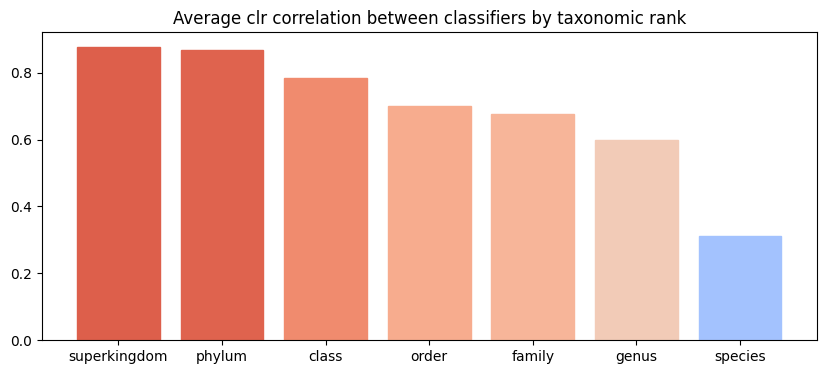

In [17]:
plt.figure(figsize=(10, 4))
plt.title('Average clr correlation between classifiers by taxonomic rank')
ranks = ['superkingdom', 'phylum', 'class', 'order', 'family', 'genus', 'species']
bars = plt.bar(ranks, [mean_of_coeffs_byrank[r] for r in ranks])
colormap = plt.cm.coolwarm
for i in range(len(ranks)):
    bars[i].set_color(colormap(bars[i].get_height()))

## Correlations between softwares - ratio of specific taxa 

### Another metric we can derive from realtive abundance values and use to examine correalations between the classifiers are ratios of specific taxa. First we look at the ratio of relative abundance of the two most common taxa at Phylum level which are Bacteroidetes and Firmicutes. Both were recognized by all five software in every sample meaning we have 103 samples in which every classifier has a prediction on the ratio in question.

In [46]:
df = pd.DataFrame(columns=['Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
for file in os.listdir(Path(os.getcwd())/'data'):
    df_i = pd.read_csv(Path('data')/file)
    firmicutes = df_i.loc[df_i['Tax ID'] == '1239']
    bacteroidetes = df_i.loc[df_i['Tax ID'] == '976']
    print(firmicutes)
    print(bacteroidetes)
    ratio = [float(firmicutes[col])/float(bacteroidetes[col]) for col in df.columns]
    print(ratio, '\n\n')
    df.loc[len(df)] = ratio
    


  Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
1   1239  60.901  54.508656    34.62    58.70686  74.481045
  Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3      Motus
2    976  34.502  8.282269    20.58    39.81166  18.742246
[1.7651440496203115, 6.581367282696336, 1.6822157434402332, 1.4746147234252476, 3.9739657329348934] 


  Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
1   1239  47.939  44.813737    29.63    42.32886  63.566756
  Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3      Motus
2    976  47.814  8.953285     22.9    52.07033  27.788407
[1.0026142970678047, 5.005284233142727, 1.293886462882096, 0.8129170681268968, 2.287527840062504] 


  Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
2   1239  46.495  39.050938    28.57     38.5397  57.125977
  Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
1    976  48.139  27.399068    39.51    54.01248  36.652003
[0.965848895905607, 1.4252652055099106, 0.7231080739053405, 0.713533242687616, 1

In [19]:
df.head(10)

,Cosmos,FOCUS,KRAKEN2,MetaPhlAn3,Motus
0,1.765144,6.581367,1.682216,1.474615,3.973966
1,1.002614,5.005284,1.293886,0.812917,2.287528
2,0.965849,1.425265,0.723108,0.713533,1.558605
3,1.108668,5.794308,1.240427,0.962588,2.758179
4,0.703678,1.721731,0.488874,0.525596,1.755818
5,1.782357,2.502186,0.885259,1.235831,2.706692
6,0.702514,0.653964,0.302062,0.342018,0.494845
7,0.690160,1.255698,0.526946,0.345438,0.884294
8,0.175209,0.223327,0.066341,0.072035,0.104060
9,4.015106,5.519258,1.465355,2.239076,3.286086


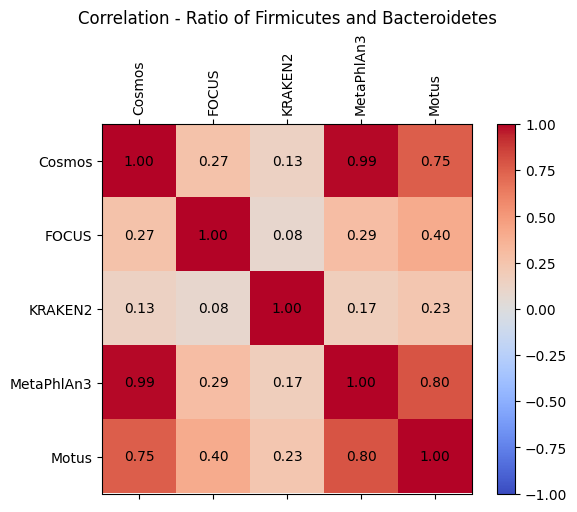

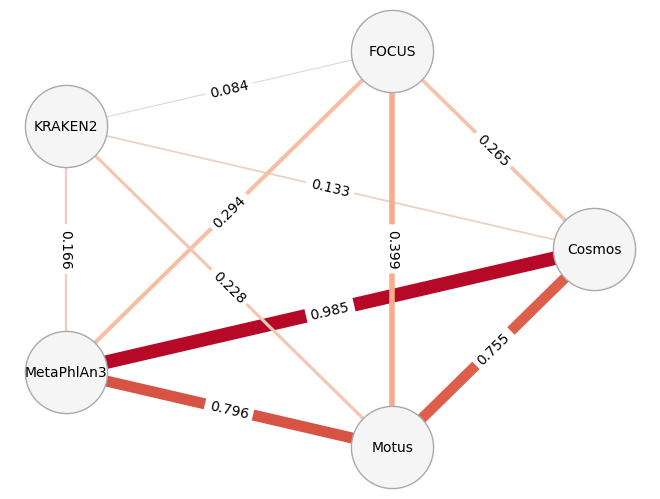

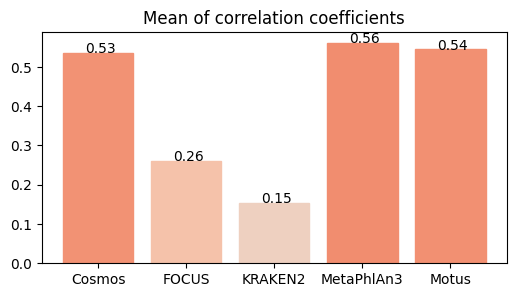

In [20]:
visualize_corr(df.fillna(0), 'Correlation - Ratio of Firmicutes and Bacteroidetes');

### Correlations between softwares - ratio of Clostridia and Bacteroidida 

In [43]:
df = pd.DataFrame(columns=['Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
for file in os.listdir(Path(os.getcwd())/'data'):
    df_i = pd.read_csv(Path('data')/file)
    clostridia = df_i.loc[df_i['Tax ID'] == '186801']
    bacteroidia = df_i.loc[df_i['Tax ID'] == '200643']
    print(clostridia)
    print(bacteroidia)
    ratio = [float(bacteroidia[col])/float(clostridia[col]) for col in df.columns]
    print(ratio, '\n\n')
    df.loc[len(df)] = ratio

   Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
7  186801  47.734  46.050488    30.99    49.78894  69.415346
   Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3      Motus
8  200643  34.502  4.349606    20.13    39.81166  18.353463
[0.7227971676373239, 0.09445298839430469, 0.6495643756050339, 0.7996085074315703, 0.2644006618334231] 


   Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
9  186801  42.913  42.122859    27.62    33.93169  60.769969
   Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3      Motus
8  200643  47.814  7.706683    22.13    52.07033  27.788407
[1.1142078158133897, 0.18295725825252812, 0.8012309920347573, 1.5345634125503325, 0.4572720330889434] 


    Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
10  186801  38.686  33.605098    26.26    36.98635  53.832625
   Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
9  200643  48.139  23.202134     39.0    54.01248  36.652003
[1.244351961950059, 0.6904349641917941, 1.4851485148514851, 

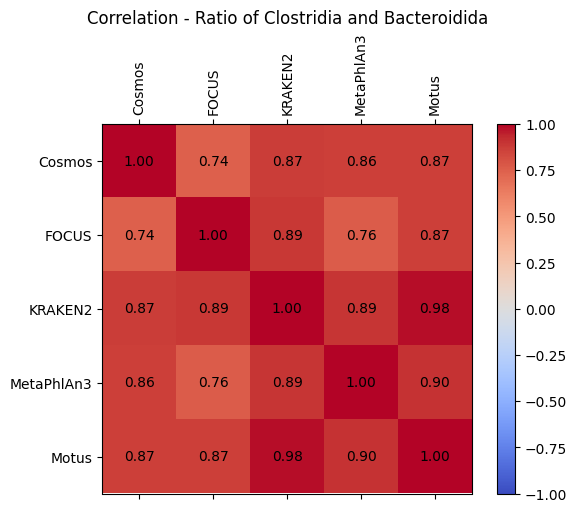

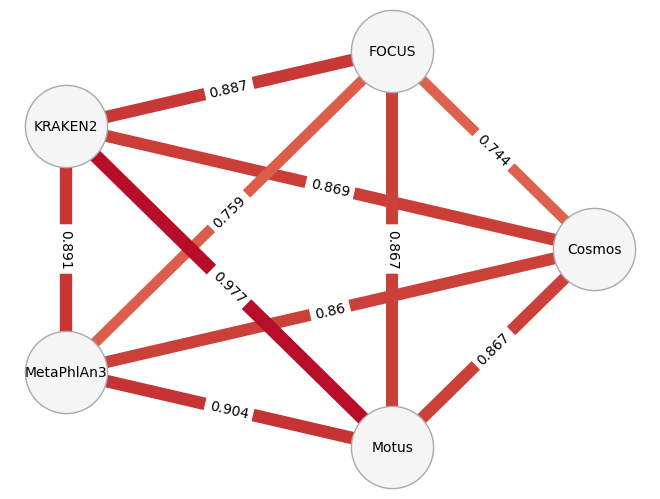

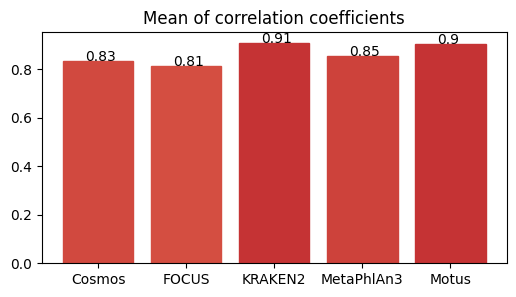

In [22]:
visualize_corr(df.fillna(0), 'Correlation - Ratio of Clostridia and Bacteroidida');

### Correlations between softwares - ratio of Prevotella and Bacteroides 

In [23]:
df = pd.DataFrame(columns=['Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
for file in os.listdir(Path(os.getcwd())/'data'):
    df_i = pd.read_csv(Path('data')/file)
    bacteroides = df_i.loc[df_i['Tax ID'] == '816']
    prevotella = df_i.loc[df_i['Tax ID'] == '838']
    print(bacteroides)
    print(prevotella)
    if not prevotella.empty and not bacteroides.empty:
        ratio = [float(bacteroides[col])/float(prevotella[col]) for col in df.columns]
        print(ratio, '\n\n')
        df.loc[len(df)] = ratio

   Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3     Motus
79    816   8.472  0.458774     4.99    13.61623  7.819979
   Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3     Motus
87    838   2.969  3.512209     3.94     9.60424  4.017272
[2.8534860222297076, 0.13062270451730543, 1.266497461928934, 1.4177311270855368, 1.9465892965199478] 


   Tax ID  Cosmos  FOCUS  KRAKEN2  MetaPhlAn3      Motus
81    816  10.752    NaN     8.33    24.65183  15.694884
   Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3     Motus
80    838  10.944  3.603258     0.76     0.00128  5.388445
[0.9824561403508771, nan, 10.960526315789474, 19259.2421875, 2.9126923723191966] 


   Tax ID  Cosmos      FOCUS  KRAKEN2  MetaPhlAn3      Motus
82    816  21.224  20.848454    19.75    38.10031  41.705516
    Tax ID  Cosmos     FOCUS  KRAKEN2  MetaPhlAn3     Motus
164    838   0.007  1.039154     0.07         NaN  0.017932
[3032.000000000043, 20.062915039217156, 282.1428571428571, nan, 2325.761903035805] 


   Tax ID  Cosmo

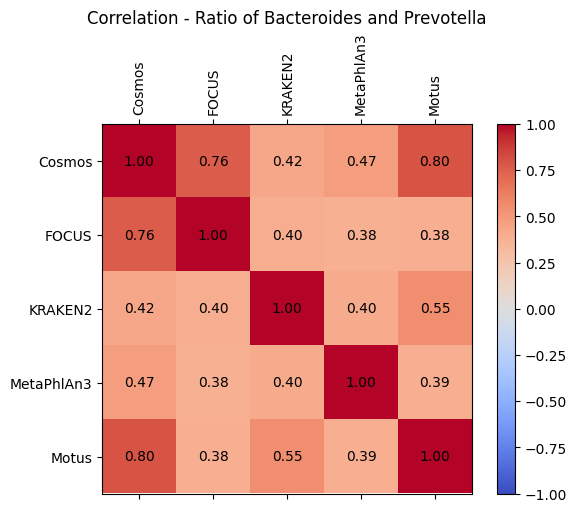

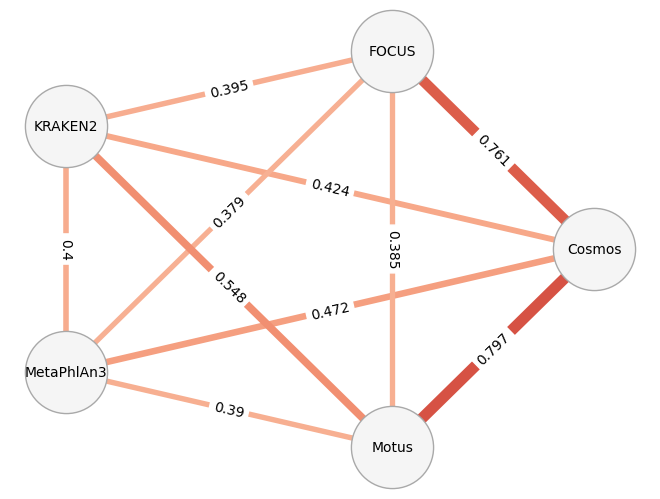

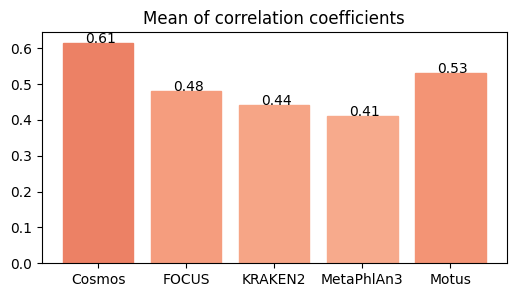

In [24]:
visualize_corr(df, 'Correlation - Ratio of Bacteroides and Prevotella');

## Calculating shannon-entropy, simpson diversity index and richness measurements of each software at every taxonomic rank
### The output is a shannon_entrpoy, simspson-diversity and richness excel file. The file contains worksheets representing the different taxonomic ranks, and each worksheet consists of the following columns:
#### 1st column: sample names
#### 2nd-6th column:  diversity values for each sample as measured by each software

In [25]:
simpson_df_dict = {}
shannon_df_dict = {}
richness_df_dict = {}
for file in os.listdir('data'):
    df = pd.read_csv(Path('data')/file)
    df['Rank'] = None
    ranks = ncbi.get_rank(df['Tax ID'])
    for key, value in ranks.items():
        df.loc[df['Tax ID'] == str(key), 'Rank'] = value
    for rank in df['Rank'].unique():
        if rank not in simpson_df_dict.keys():
            simpson_df_dict[rank] = pd.DataFrame(columns=['sample', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
        if rank not in shannon_df_dict.keys():
            shannon_df_dict[rank] = pd.DataFrame(columns=['sample', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
        if rank not in richness_df_dict.keys():
            richness_df_dict[rank] = pd.DataFrame(columns=['sample', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn3', 'Motus'])
#         print(f'\n\nIn file: {file} at RANK:{rank}\n{df.loc[df["Rank"] == rank]}')
        si_row = [simpson(df.loc[df['Rank'] == rank][col].dropna()) for col in df.columns if col != 'Tax ID' and col != 'Rank']
        si_row.insert(0, file)
        simpson_df_dict[rank].loc[len(simpson_df_dict[rank])] = si_row

        sh_row = [shannon(df.loc[df['Rank'] == rank][col].dropna()) for col in df.columns if col != 'Tax ID' and col != 'Rank']
        sh_row.insert(0, file)
        shannon_df_dict[rank].loc[len(shannon_df_dict[rank])] = sh_row

        ri_row = [df.loc[df['Rank'] == rank][col].count() for col in df.columns if col != 'Tax ID' and col != 'Rank']
        ri_row.insert(0, file)
        richness_df_dict[rank].loc[len(richness_df_dict[rank])] = ri_row

# writer = pd.ExcelWriter('shannon_entropy.xlsx', engine='xlsxwriter')
# for key, value in shannon_df_dict.items():
#     value.to_excel(excel_writer=writer, sheet_name=key, index=False) if key else None
# writer.save()

# writer = pd.ExcelWriter('simpson_diversity.xlsx', engine='xlsxwriter')
# for key, value in simpson_df_dict.items():
#     value.to_excel(excel_writer=writer, sheet_name=key, index=False) if key else None
# writer.save()

# writer = pd.ExcelWriter('richness.xlsx', engine='xlsxwriter')
# for key, value in richness_df_dict.items():
#     value.to_excel(excel_writer=writer, sheet_name=key, index=False) if key else None
# writer.save()

### Avarage simspon diversirty index at every taxonomic rank for each software

In [26]:
df_simpson = pd.ExcelFile('simpson_diversity.xlsx')
df_simpson_avarage = pd.DataFrame(columns=['rank', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn', 'Motus'])
for sheet in df_simpson.sheet_names:
    df = df_simpson.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    avarages = list(df.mean())
    avarages.insert(0, sheet)
    df_simpson_avarage.loc[len(df_simpson_avarage.index)] = avarages
# df_simpson_avarage.to_csv('simpson_diversity_avarages.csv')
df_simpson_avarage

,rank,Cosmos,FOCUS,KRAKEN2,MetaPhlAn,Motus
0,superkingdom,0.000742,0.146217,0.065246,0.001443,0.000720
1,phylum,0.513852,0.665152,0.578420,0.516414,0.498276
2,class,0.564383,0.698781,0.613447,0.539742,0.539903
3,order,0.565346,0.724139,0.612497,0.540259,0.540107
4,family,0.775241,0.847305,0.759948,0.695947,0.750249
5,genus,0.880586,0.883020,0.839133,0.771590,0.772990
6,species,0.952969,0.915422,0.887940,0.866316,0.862657
7,strain,0.891093,1.000000,0.743525,1.000000,1.000000
8,subspecies,0.348948,1.000000,0.478118,0.300971,1.000000
9,no rank,0.970874,1.000000,0.550239,1.000000,0.990291


### Avarage shannon entropy at every taxonomic rank for each software

In [27]:
df_shannon = pd.ExcelFile('shannon_entropy.xlsx')
df_shannon_avarage = pd.DataFrame(columns=['rank', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn', 'Motus'])
for sheet in df_shannon.sheet_names:
    df = df_shannon.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    avarages = list(df.mean())
    avarages.insert(0, sheet)
    df_shannon_avarage.loc[len(df_shannon_avarage.index)] = avarages
# df_shannon_avarage.to_csv('shannon_entropy_avarages.csv')
df_shannon_avarage

,rank,Cosmos,FOCUS,KRAKEN2,MetaPhlAn,Motus
0,superkingdom,0.003841,0.366511,0.199351,0.007029,0.003822
1,phylum,1.256514,2.041115,1.608098,1.273197,1.266006
2,class,1.558396,2.378815,1.978329,1.452911,1.528846
3,order,1.583417,2.635445,2.141159,1.471742,1.552653
4,family,2.911673,3.454968,3.138646,2.403347,2.762214
5,genus,4.157121,3.899376,4.122563,3.105789,3.122529
6,species,5.840113,4.169318,5.049829,4.085507,4.147857
7,strain,4.372792,0.000000,3.221226,0.000000,0.000000
8,subspecies,0.328798,0.000000,1.441944,0.000000,0.000000
9,no rank,0.000000,0.000000,1.422168,0.000000,0.000000


### Avarage richness at every taxonomic rank for each software

In [28]:
df_richness = pd.ExcelFile('richness.xlsx')
df_richness_avarage = pd.DataFrame(columns=['rank', 'Cosmos', 'FOCUS', 'KRAKEN2', 'MetaPhlAn', 'Motus'])
for sheet in df_richness.sheet_names:
    df = df_richness.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    avarages = list(df.mean())
    avarages.insert(0, sheet)
    df_richness_avarage.loc[len(df_richness_avarage.index)] = avarages
# df_richness_avarage.to_csv('richness_avarages.csv')
df_richness_avarage


,rank,Cosmos,FOCUS,KRAKEN2,MetaPhlAn,Motus
0,superkingdom,1.291262,1.990291,3.980583,1.349515,1.281553
1,phylum,6.000000,10.135922,19.951456,5.233010,5.902913
2,class,11.475728,14.339806,35.776699,9.757282,11.466019
3,order,14.970874,20.398058,80.834951,11.864078,14.825243
4,family,27.281553,25.572816,155.077670,19.262136,22.951456
5,genus,68.398058,33.213592,246.543689,38.165049,40.310680
6,species,177.359223,34.737864,232.184466,73.048544,76.000000
7,strain,65.834951,0.000000,41.281553,0.000000,0.000000
8,subspecies,1.407767,0.000000,5.873786,0.699029,0.000000
9,no rank,0.029126,0.000000,74.359223,0.000000,0.009709


### Correlations between softwares - Simpson's Diversity Index
#### Visualization of correlations between Simpson's Diversity Index calculated based on each classifier. 
    

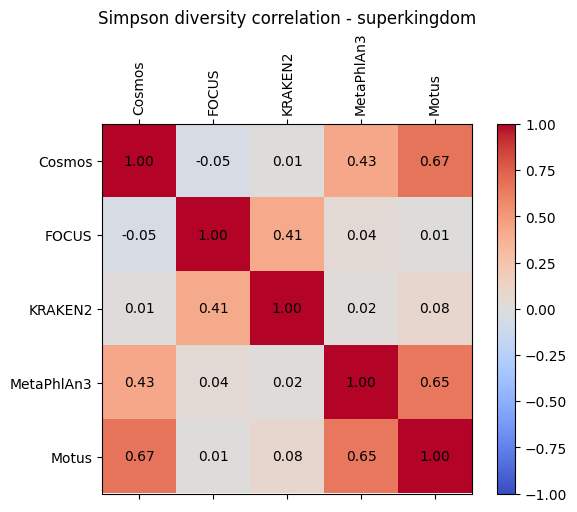

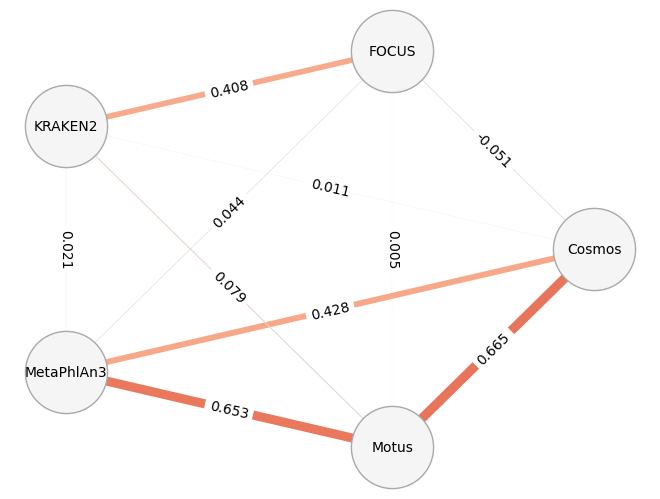

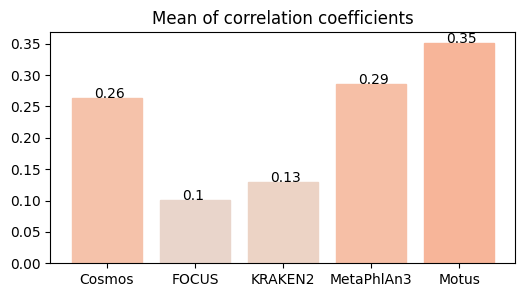

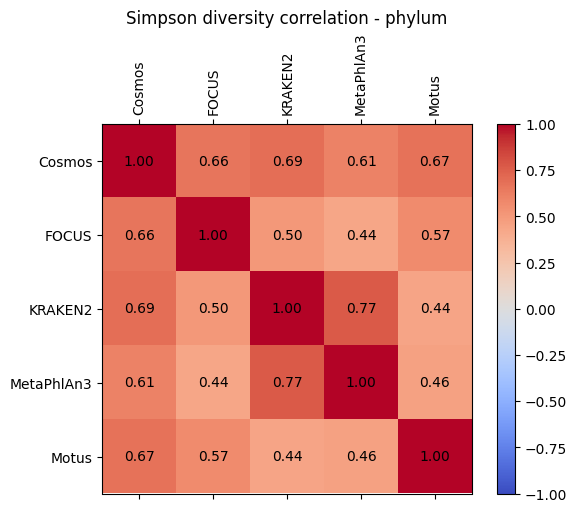

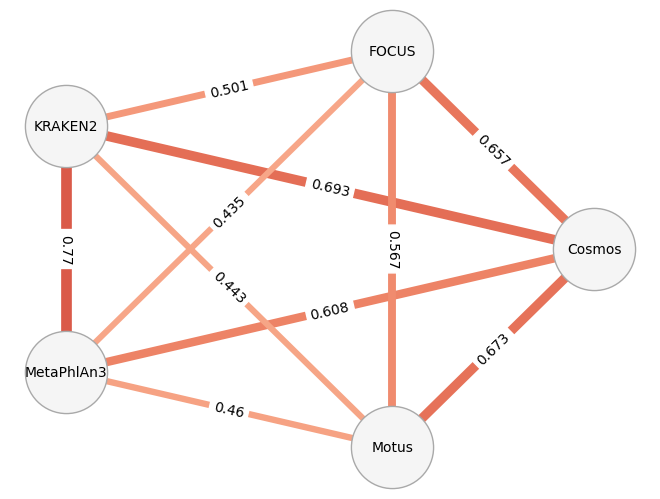

...

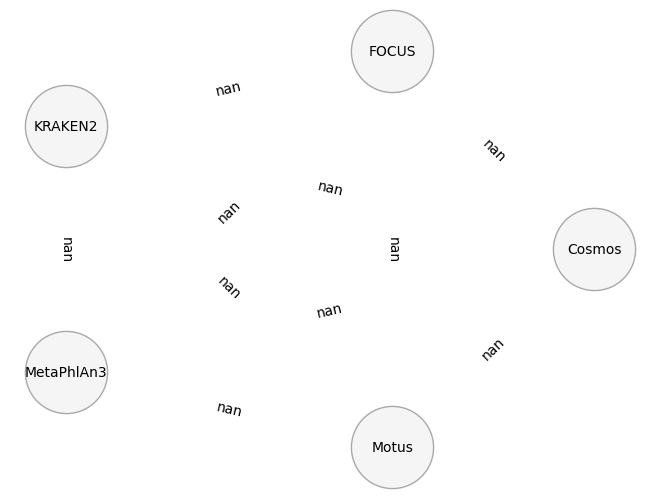

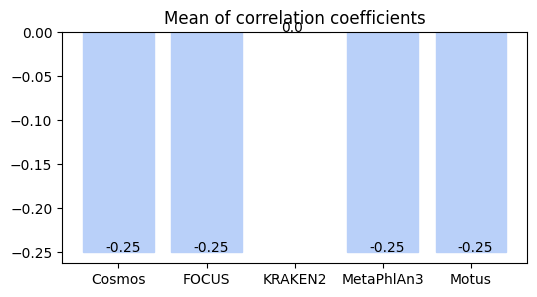

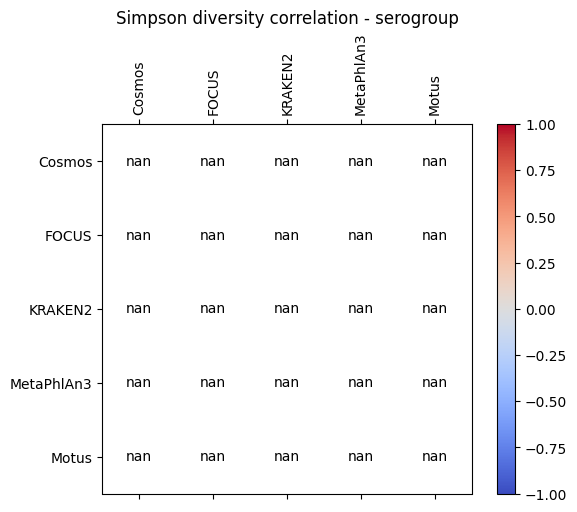

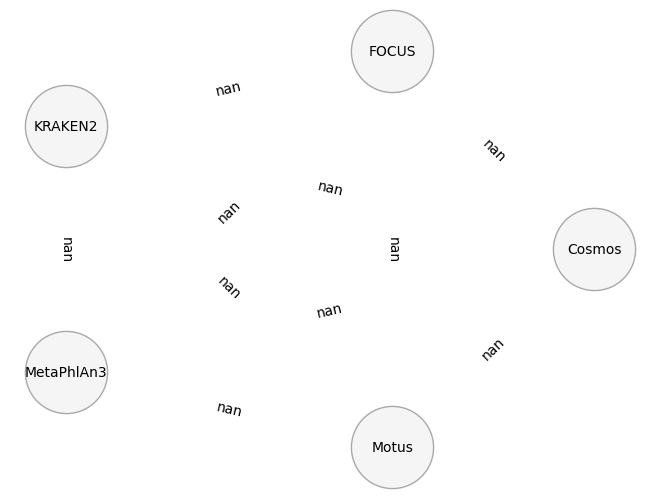

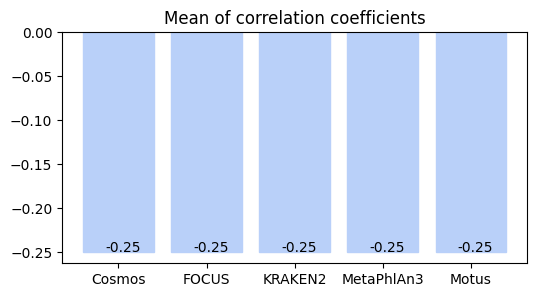

In [29]:
df_simpson = pd.ExcelFile('simpson_diversity.xlsx')
for sheet in df_simpson.sheet_names:
    df = df_simpson.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    visualize_corr(df, f'Simpson diversity correlation - {sheet}');

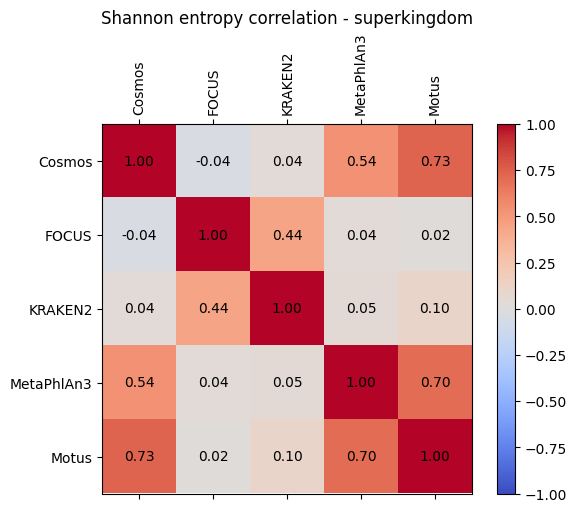

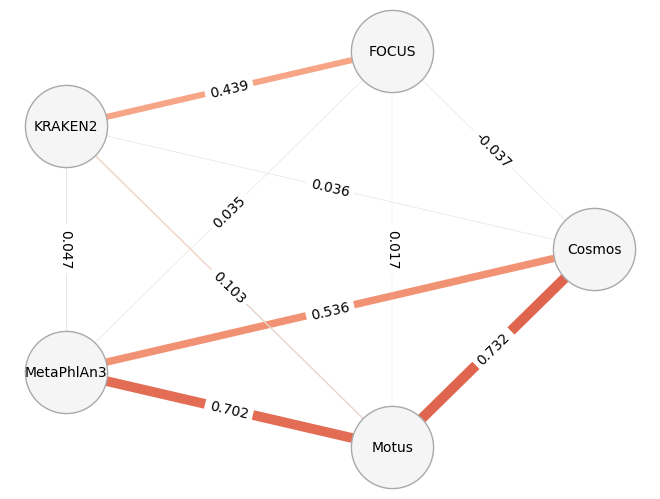

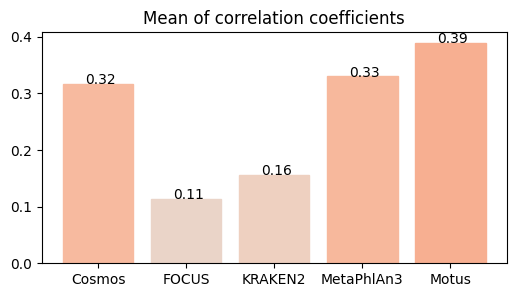

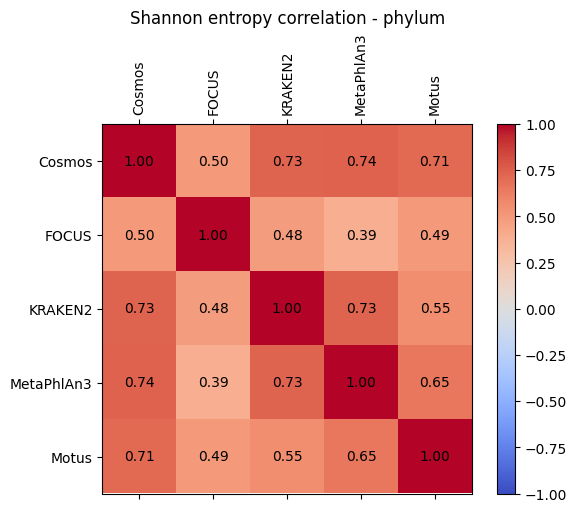

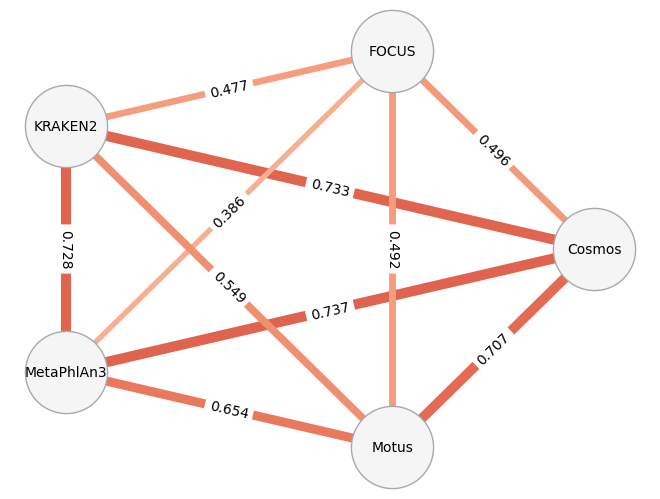

...

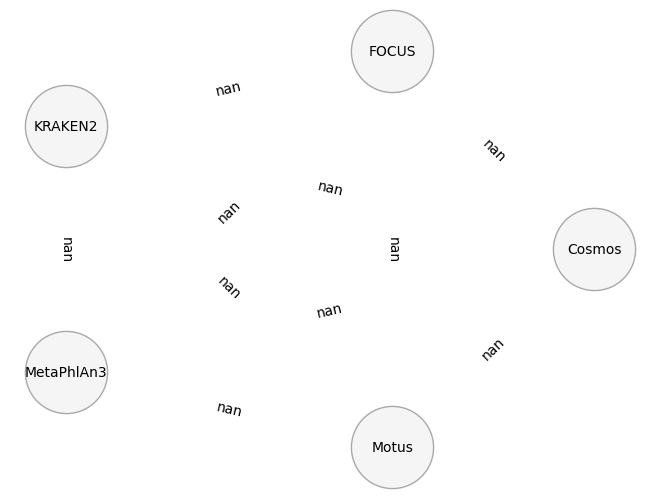

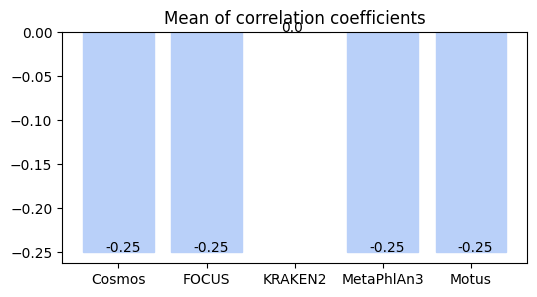

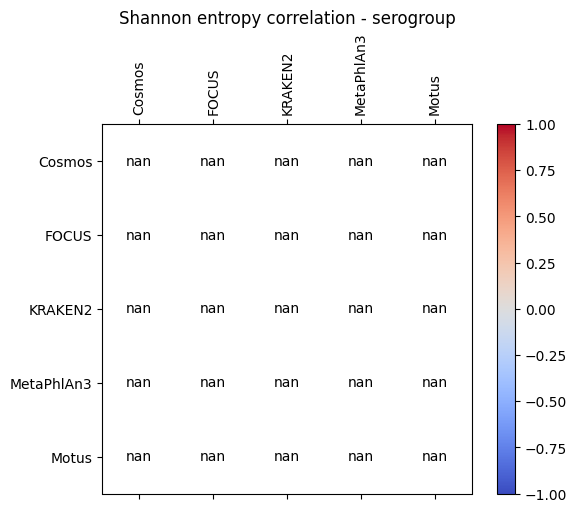

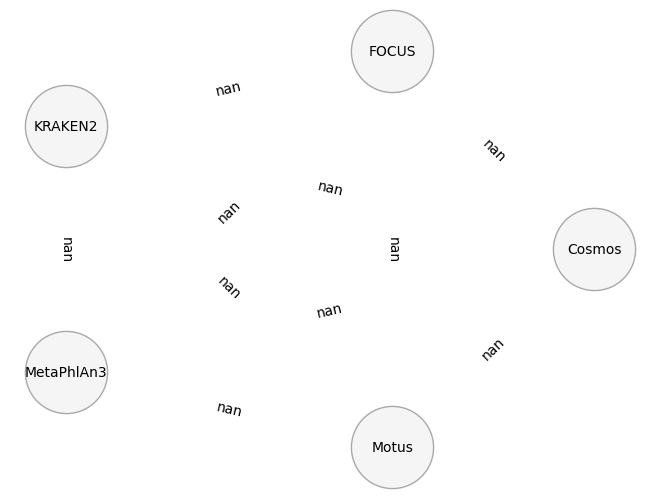

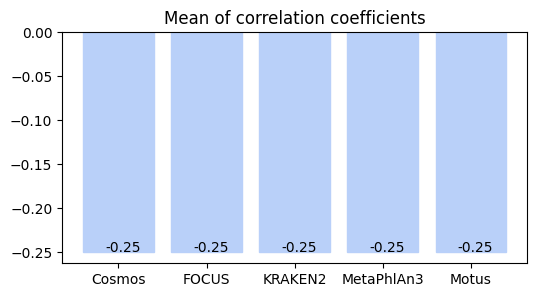

In [30]:
df_shannon = pd.ExcelFile('shannon_entropy.xlsx')
for sheet in df_shannon.sheet_names:
    df = df_shannon.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    visualize_corr(df, f'Shannon entropy correlation - {sheet}');

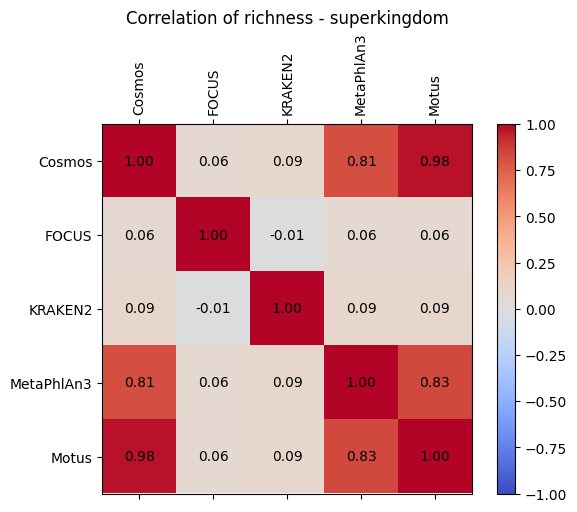

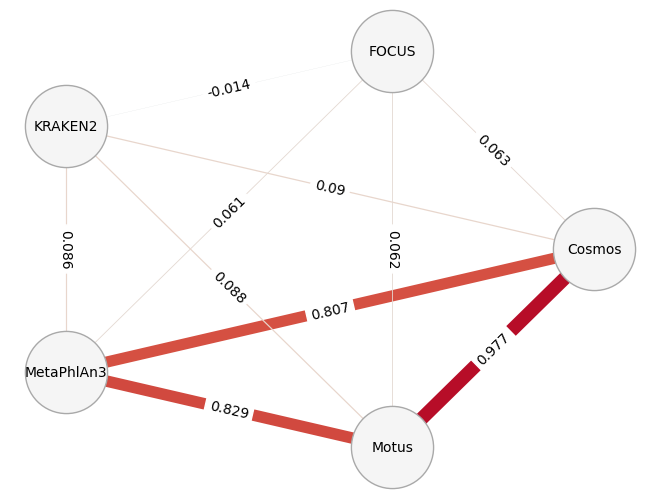

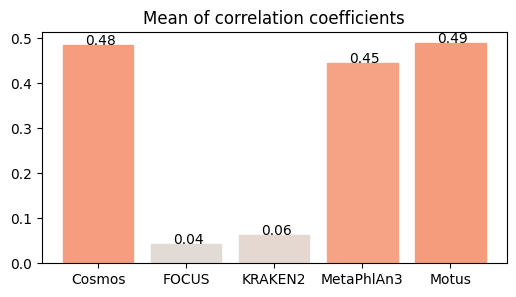

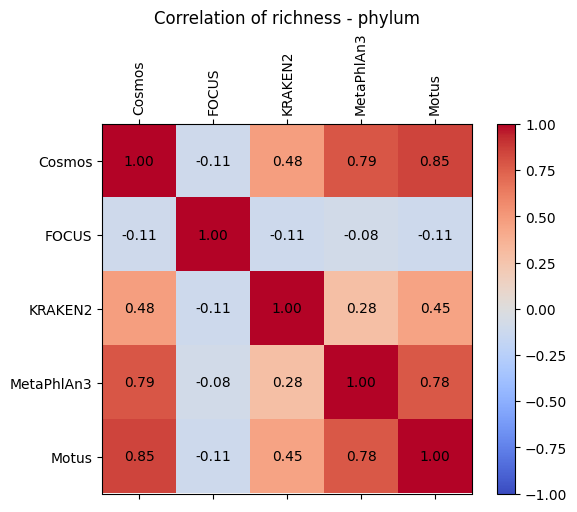

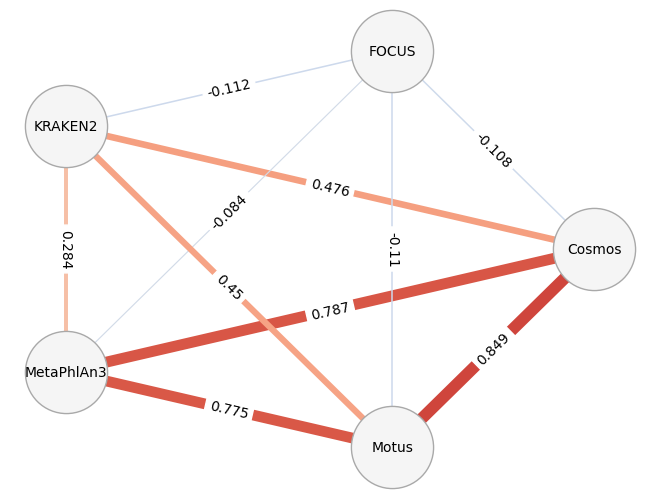

...

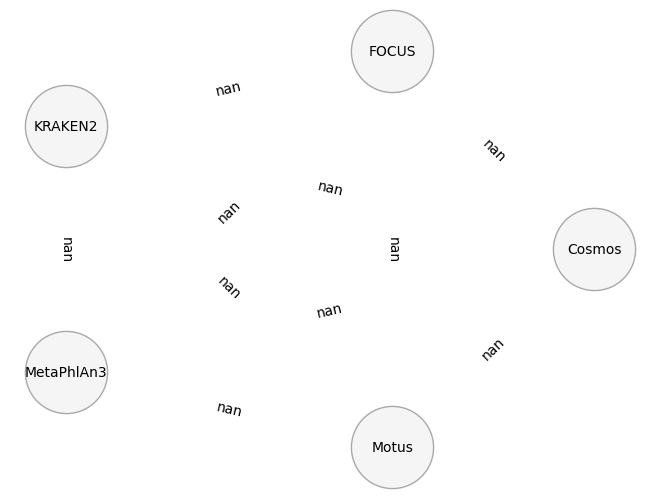

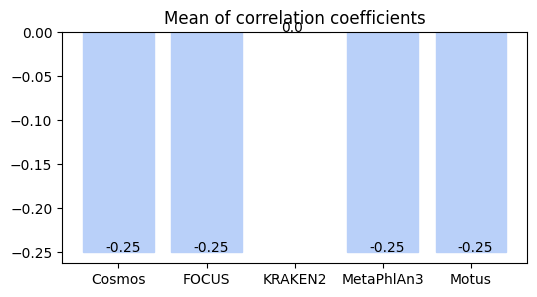

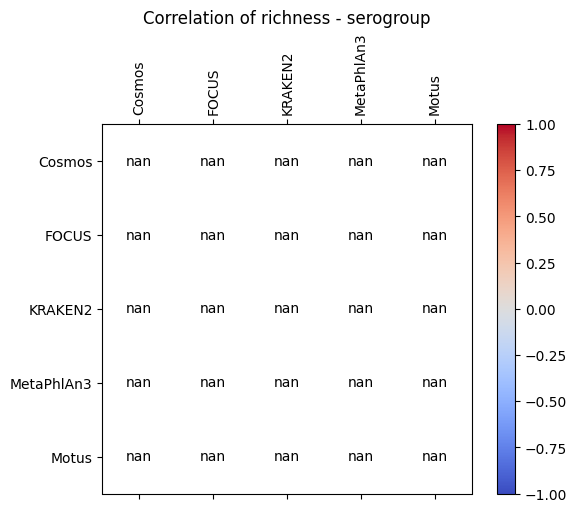

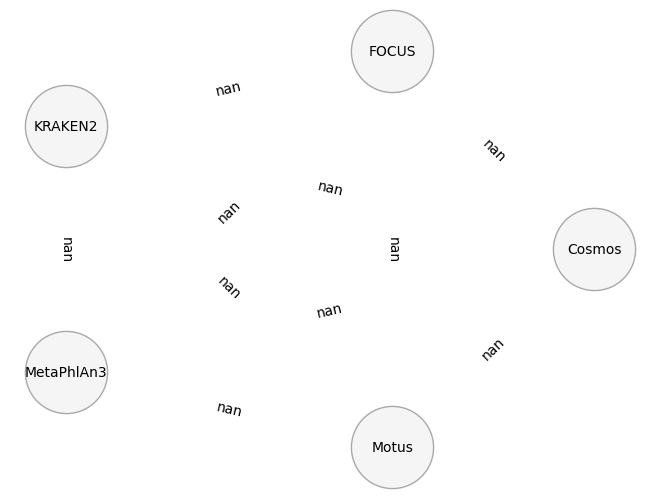

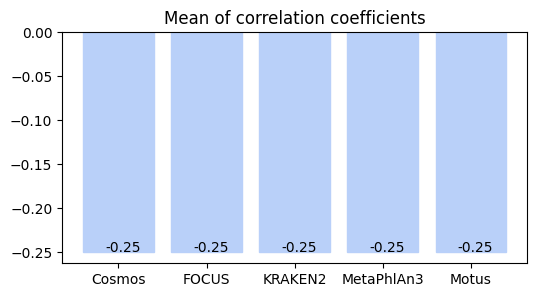

In [31]:
df_richness = pd.ExcelFile('richness.xlsx')
for sheet in df_richness.sheet_names:
    df = df_richness.parse(sheet)
    df.drop(['sample'], axis=1, inplace=True)
    visualize_corr(df, f'Correlation of richness - {sheet}');

## PCA - Pca separately for each software and comparison of principal component coefficients

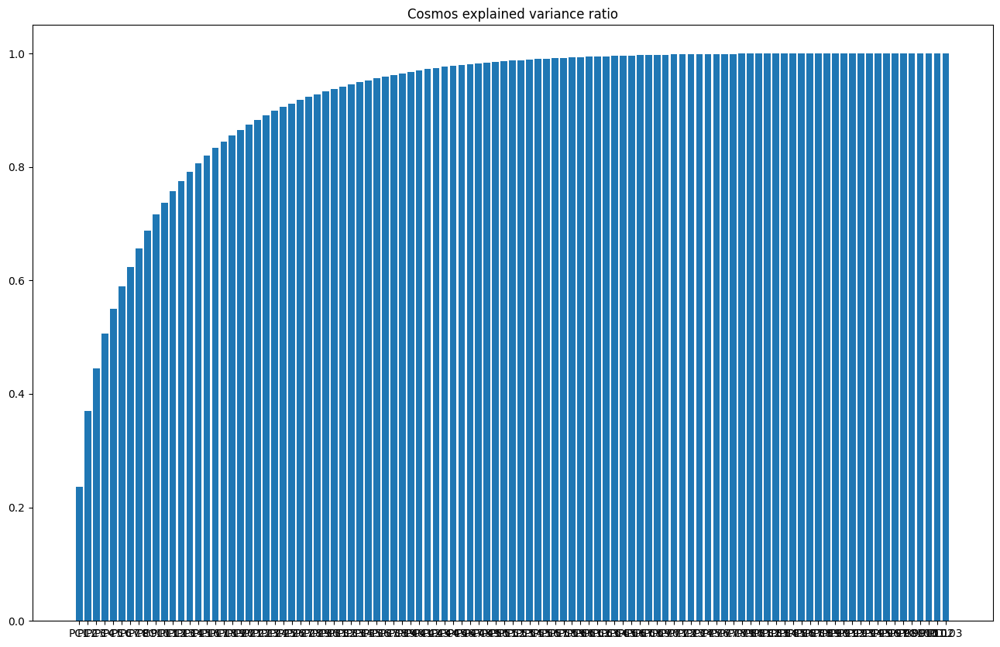

       PC1 coeffs  PC2 coeffs  PC3 coeffs  PC4 coeffs  PC5 coeffs  PC6 coeffs
543      0.279407    0.193574    0.107498    0.056707   -0.000537   -0.135540
91347    0.275788    0.194355    0.109251    0.057416    0.001012   -0.125380
1236     0.257919    0.190540    0.145890    0.011739   -0.007814   -0.091648
561      0.186629   -0.001611   -0.116852   -0.039758    0.035387    0.028353
1224     0.170183    0.144793    0.132356    0.109343    0.025429    0.020554


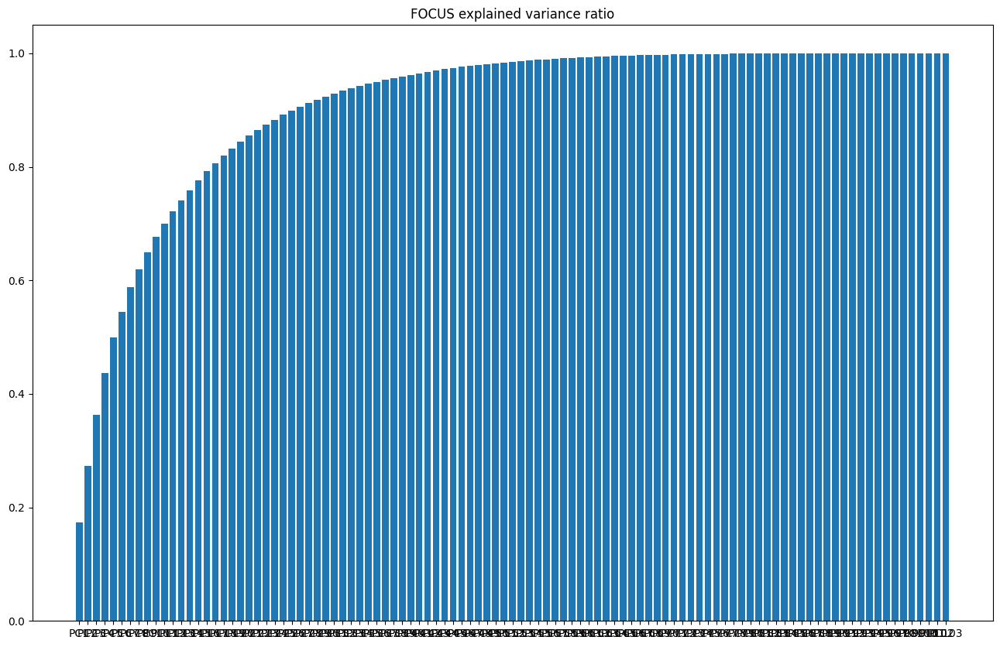

        PC1 coeffs  PC2 coeffs  PC3 coeffs  PC4 coeffs  PC5 coeffs  PC6 coeffs
1236      0.176764    0.047188    0.104995   -0.043174   -0.129253    0.134391
28890     0.136272   -0.027787   -0.057156   -0.033191    0.041900   -0.094769
712       0.132492   -0.056408   -0.088108   -0.082771    0.038144   -0.116422
135625    0.132492   -0.056408   -0.088108   -0.082771    0.038144   -0.116422
2157      0.099104   -0.044199   -0.028271   -0.051505    0.054973   -0.084370


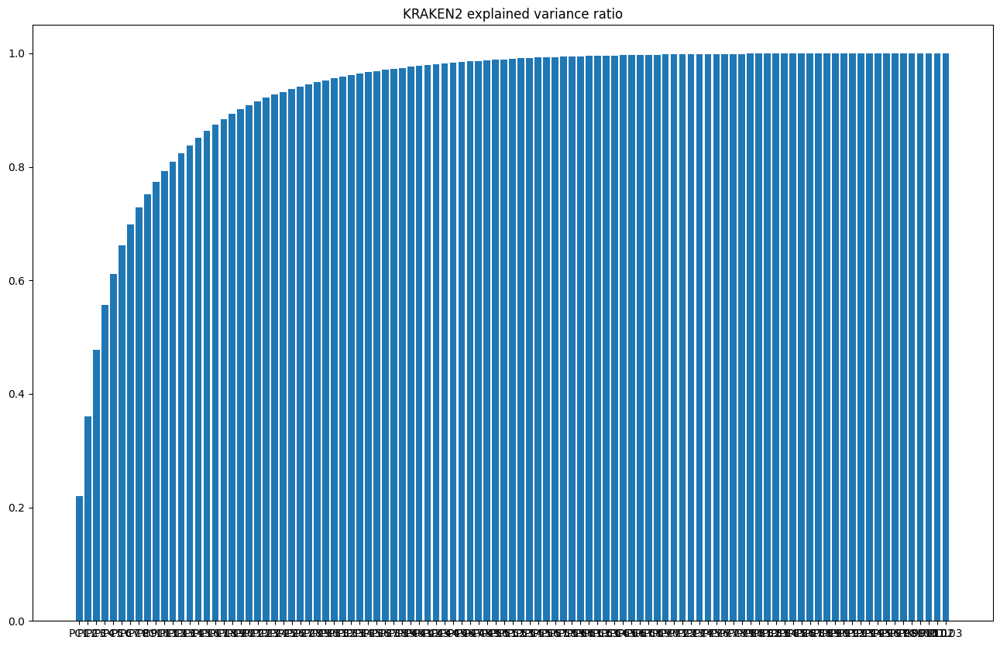

       PC1 coeffs  PC2 coeffs  PC3 coeffs  PC4 coeffs  PC5 coeffs  PC6 coeffs
543      0.260828   -0.027383    0.005185    0.115530    0.046760   -0.047048
561      0.251422    0.025438   -0.012381    0.008812    0.030584   -0.053415
91347    0.239784   -0.025948    0.010644    0.108752    0.051640   -0.044493
1236     0.191836   -0.025010    0.018064    0.105999    0.050689   -0.024839
29466    0.176242    0.115081   -0.151877   -0.046153   -0.045027   -0.028958


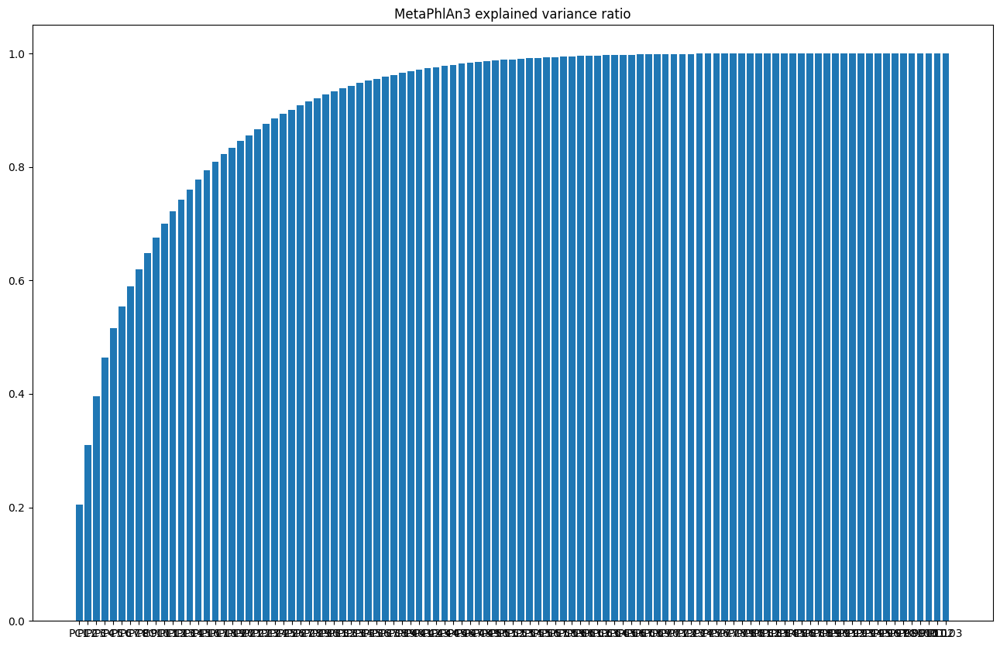

       PC1 coeffs  PC2 coeffs  PC3 coeffs  PC4 coeffs  PC5 coeffs  PC6 coeffs
543      0.297166   -0.032378   -0.117225    0.195757    0.077443   -0.010954
91347    0.294903   -0.035994   -0.109378    0.205868    0.056000   -0.008576
1236     0.289115   -0.047616   -0.114503    0.187565    0.060800    0.012289
561      0.210884    0.025256   -0.038249   -0.029619   -0.021110   -0.065889
1224     0.195866   -0.016562   -0.067924    0.211269   -0.040894    0.097083


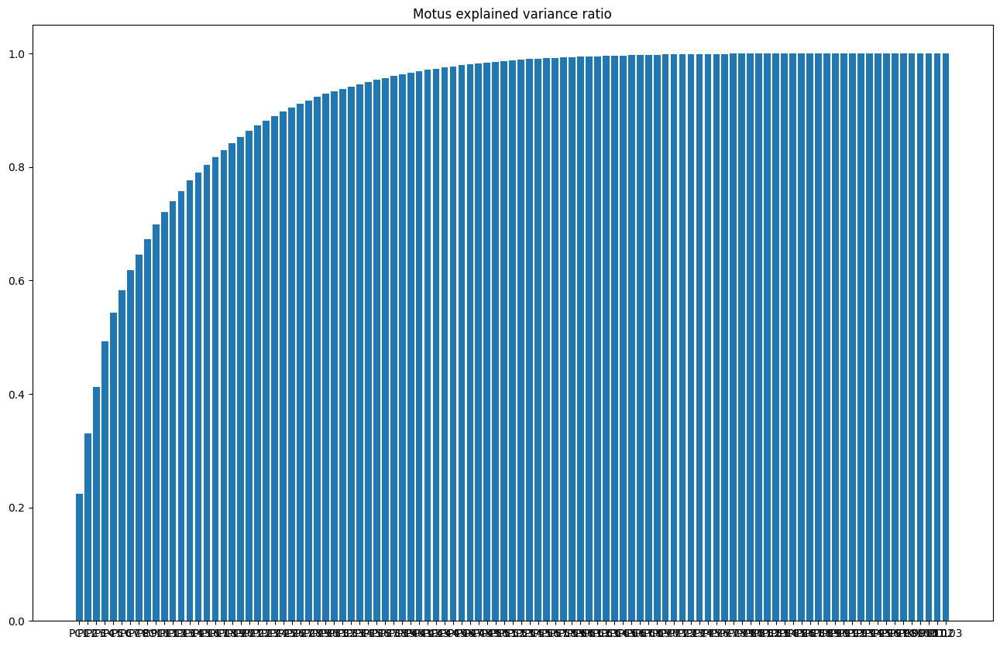

        PC1 coeffs  PC2 coeffs  PC3 coeffs  PC4 coeffs  PC5 coeffs  PC6 coeffs
543       0.293923   -0.091308    0.151777    0.030724    0.087656    0.150325
91347     0.293923   -0.091308    0.151777    0.030724    0.087656    0.150325
1236      0.270929   -0.094036    0.162891    0.077545    0.097303    0.146282
186826    0.177471   -0.072461    0.034476    0.025563   -0.095340   -0.136180
91061     0.164932   -0.020527    0.078098    0.014319   -0.096191   -0.164639


In [32]:
common_taxids = list(df_average.dropna()['Tax ID'])
pca1_coefficients = pd.DataFrame(index=common_taxids)
pca2_coefficients = pd.DataFrame(index=common_taxids)
for file in os.listdir():
    if 'clr_standardized' in file:
        df = pd.read_csv(Path(os.getcwd())/file)[common_taxids]
        taxids = list(df.T.index.values)
        features = df.values
        pca = PCA()
        pca.fit(features)    
        
        fig = plt.figure(figsize = (16, 10))
        plt.bar([f'PC{x+1}' for x in range(len(pca.explained_variance_ratio_))], np.cumsum(pca.explained_variance_ratio_))
        plt.title(f'{file.split("_")[0]} explained variance ratio')
        plt.show()
        
#       
        loading_scores = pd.DataFrame(data=pca.components_[:6].T, index=taxids, columns=[f'PC{x+1} coeffs' for x in range(6)])
        loading_scores.sort_values(by=['PC1 coeffs'], inplace=True, ascending=False)
        pca1_coefficients = pd.concat([loading_scores['PC1 coeffs'], pca1_coefficients], axis=1)
        pca1_coefficients.rename(columns={'PC1 coeffs':f'{file.split("_")[0]}'}, inplace=True)
        pca2_coefficients = pd.concat([loading_scores['PC2 coeffs'], pca2_coefficients], axis=1)
        pca2_coefficients.rename(columns={'PC2 coeffs':f'{file.split("_")[0]}'}, inplace=True)
        print(loading_scores.head())
# pca1_coefficients.to_csv('pca1_coefficients.csv')
# pca2_coefficients.to_csv('pca2_coefficients.csv')
                                       

In [33]:
print(pca1_coefficients.head(10))
print()
print(pca2_coefficients.head(10))  

           Motus  MetaPhlAn3   KRAKEN2     FOCUS    Cosmos
543     0.293923    0.297166  0.260828  0.067371  0.279407
91347   0.293923    0.294903  0.239784  0.067371  0.275788
1236    0.270929    0.289115  0.191836  0.176764  0.257919
186826  0.177471    0.126327  0.127052 -0.009478  0.160331
91061   0.164932    0.130336  0.090681  0.078138  0.161638
1224    0.159845    0.195866  0.152677  0.051383  0.170183
547     0.157432    0.137718  0.170902  0.027013  0.146893
29465   0.153745    0.141804  0.164133  0.002023  0.165062
33958   0.123809    0.092913  0.063636  0.003390  0.073989
1578    0.123572    0.092665  0.001745 -0.001532 -0.000788

           Motus  MetaPhlAn3   KRAKEN2     FOCUS    Cosmos
543    -0.091308   -0.032378 -0.027383  0.126221  0.193574
91347  -0.091308   -0.035994 -0.025948  0.126221  0.194355
1236   -0.094036   -0.047616 -0.025010  0.047188  0.190540
186826 -0.072461   -0.035201  0.000770  0.006979  0.047895
91061  -0.020527   -0.037657  0.003186  0.042256  0.049

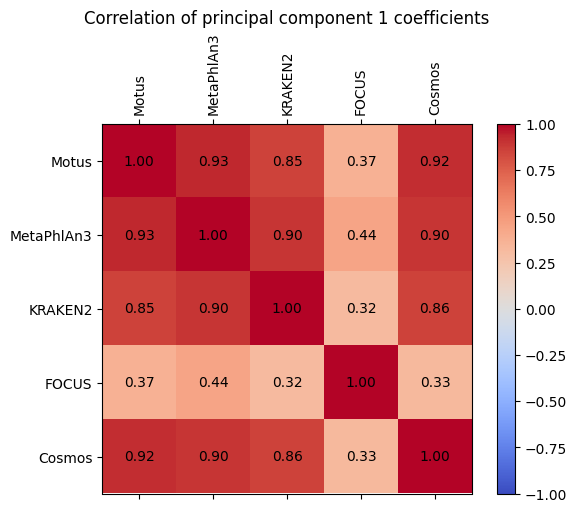

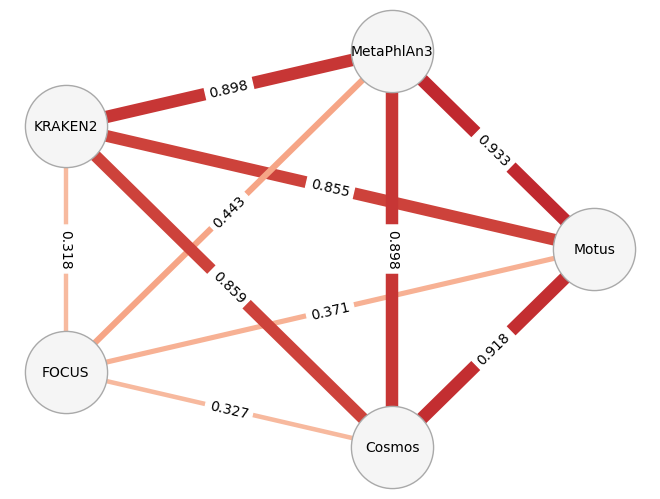

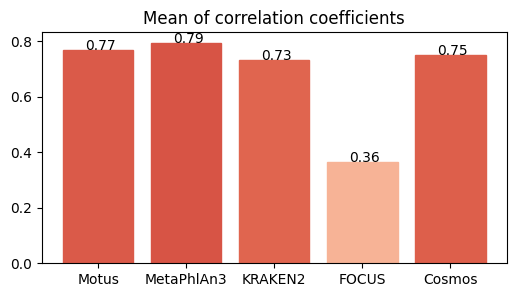

In [34]:
visualize_corr(pca1_coefficients, 'Correlation of principal component 1 coefficients');

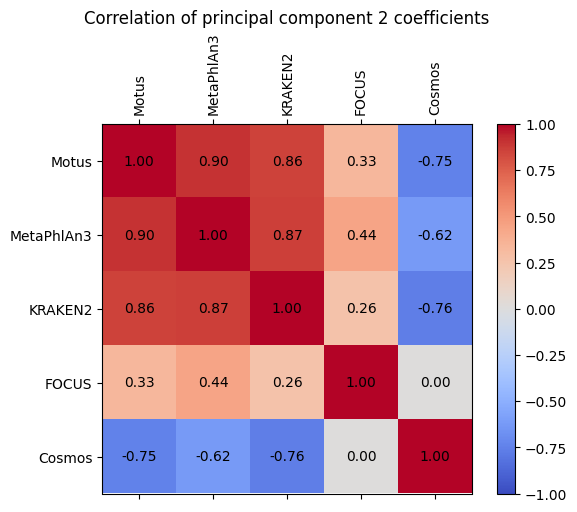

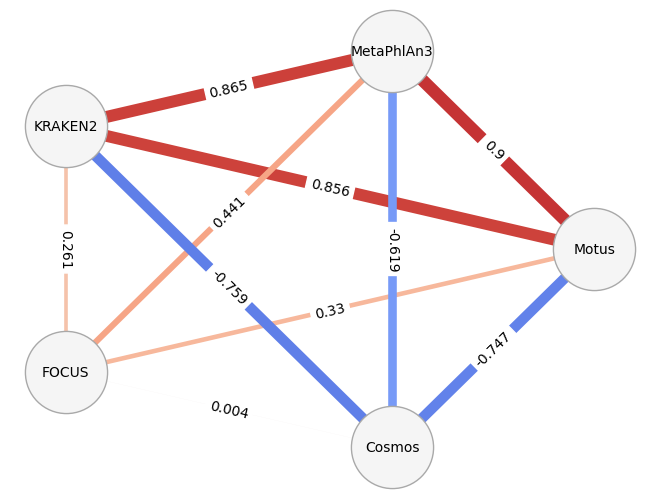

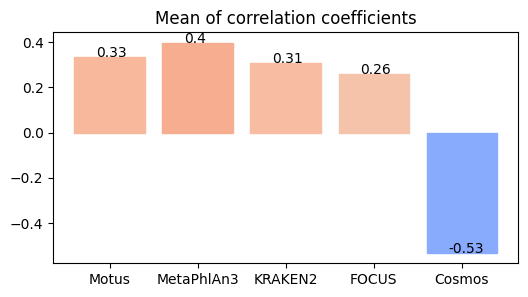

In [35]:
visualize_corr(pca2_coefficients, 'Correlation of principal component 2 coefficients');

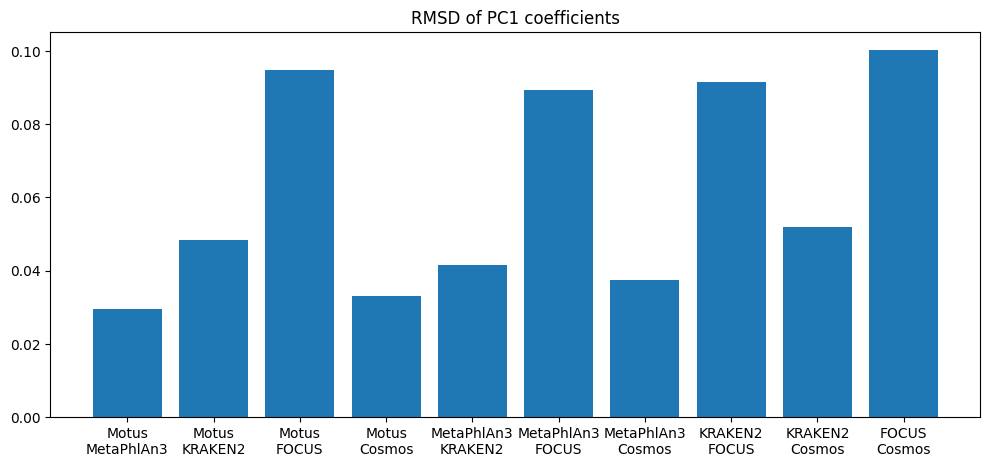

In [36]:
pairs = list(combinations(pca1_coefficients.columns, 2))
diff = [np.sqrt(np.mean((pca1_coefficients[pair[0]] - pca1_coefficients[pair[1]])**2)) for pair in pairs]
plt.figure(figsize = (12, 5))
plt.bar(['\n'.join(pair) for pair in pairs], diff)
plt.title('RMSD of PC1 coefficients')
plt.show()

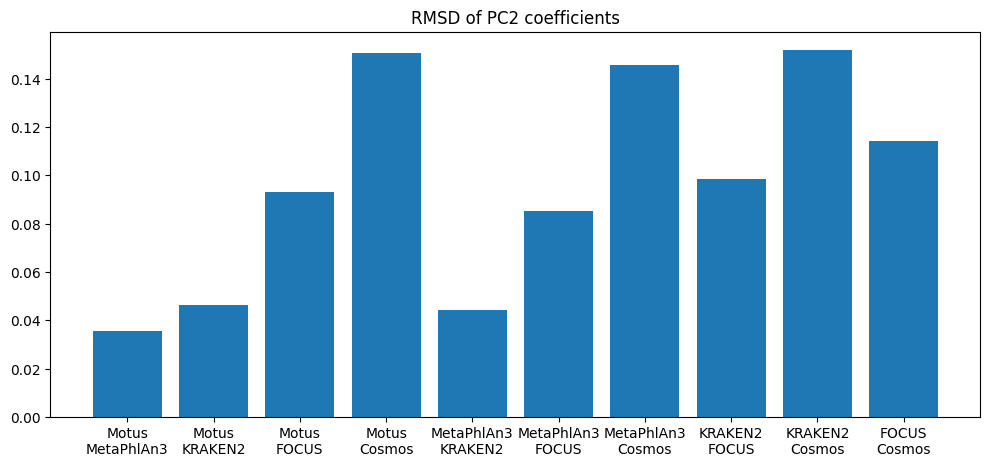

In [37]:
pairs = list(combinations(pca2_coefficients.columns, 2))
diff = [np.sqrt(np.mean((pca2_coefficients[pair[0]] - pca2_coefficients[pair[1]])**2)) for pair in pairs]
plt.figure(figsize = (12, 5))
plt.bar(['\n'.join(pair) for pair in pairs], diff)
plt.title('RMSD of PC2 coefficients')
plt.show()

## PCA - Fit on aggregated

In [38]:
common_taxids = list(df_average.dropna()['Tax ID'])
df_common = pd.DataFrame()
for file in os.listdir():
    if 'clr_standardized' in file:
        df = pd.read_csv(file)[common_taxids+['Unnamed: 0']]
        df_common = pd.concat([df, df_common], ignore_index=True, axis=0)
df_common.rename(columns={'Unnamed: 0': 'sample'}, inplace=True)
df_common = df_common.groupby(['sample']).mean()

pca = PCA(n_components=2, whiten=True)
pca.fit(df_common.values)
for file in os.listdir():
    if 'clr_standardized' in file:
        df = pd.read_csv(file, index_col=0)[common_taxids]
        principal_components = pd.DataFrame(pca.transform(df.values), columns=['PC1', 'PC2'])
#         principal_components.to_csv(f'{file.split("_")[0]}_pca_common_taxids.csv')

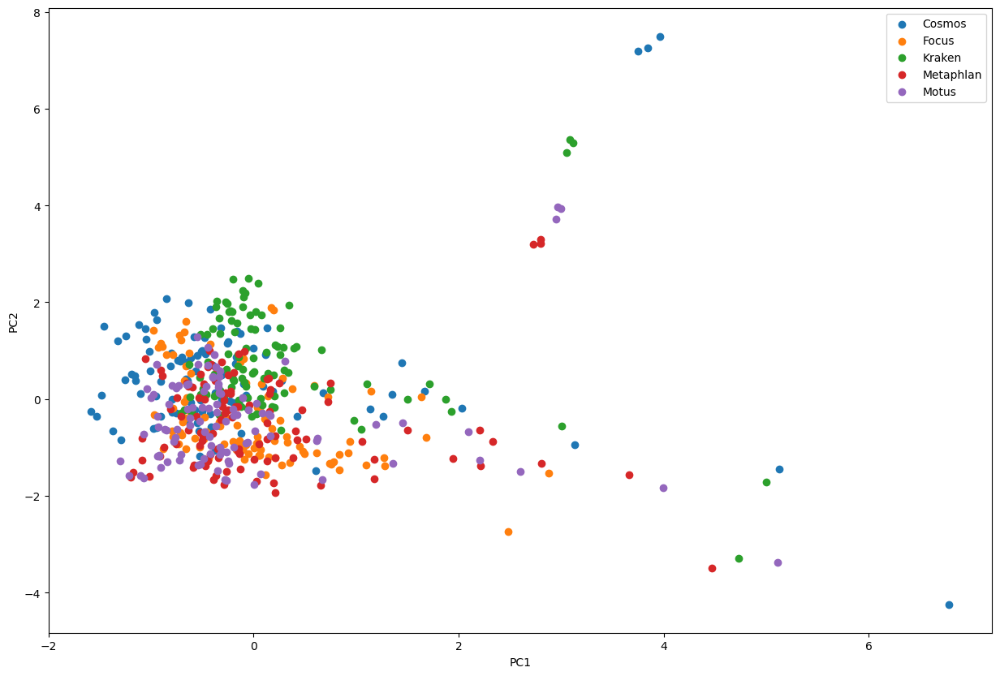

In [39]:
plt.figure(figsize=(15, 10))
for file in os.listdir(os.getcwd()):
    if 'pca_common' in file:
        df = pd.read_csv(Path(os.getcwd())/file)
        plt.scatter(x=df['PC1'], y=df['PC2'])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
plt.legend(['Cosmos', 'Focus', 'Kraken', 'Metaphlan', 'Motus'])
plt.show()

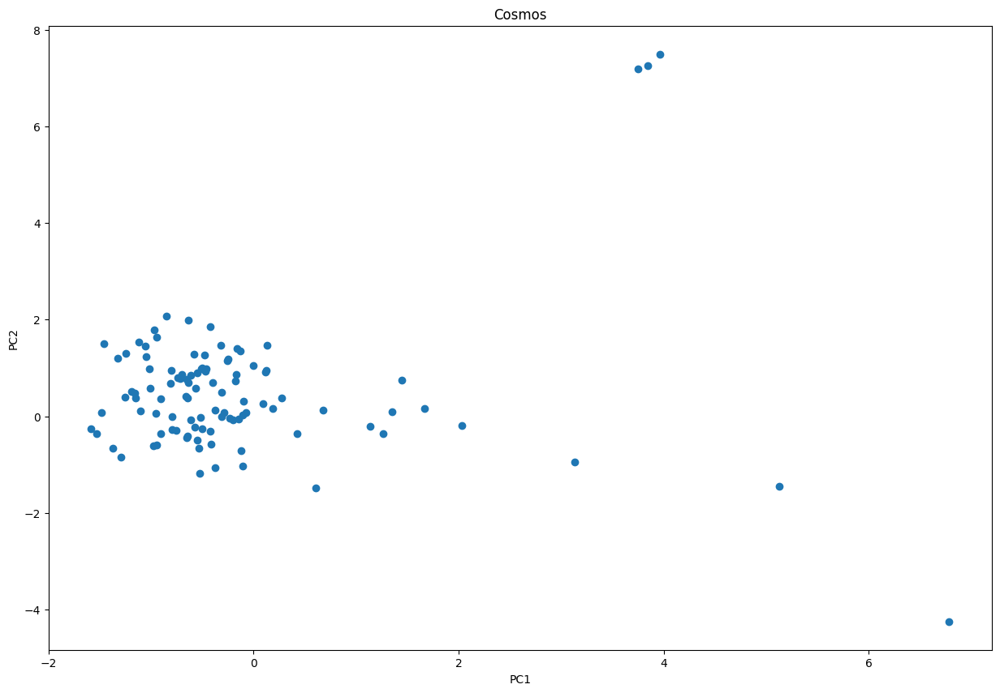

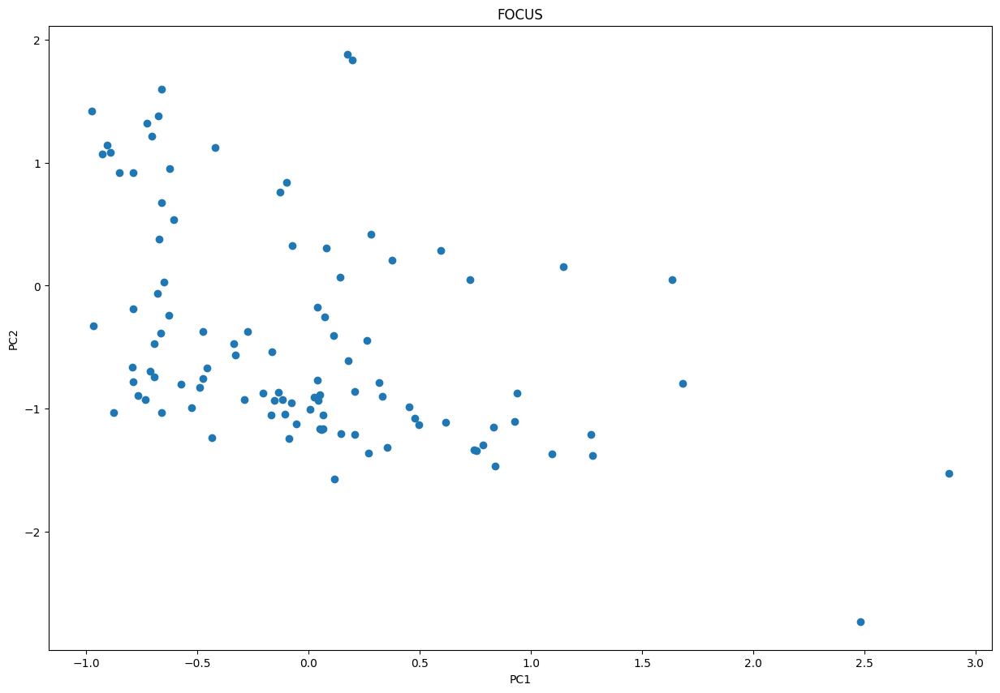

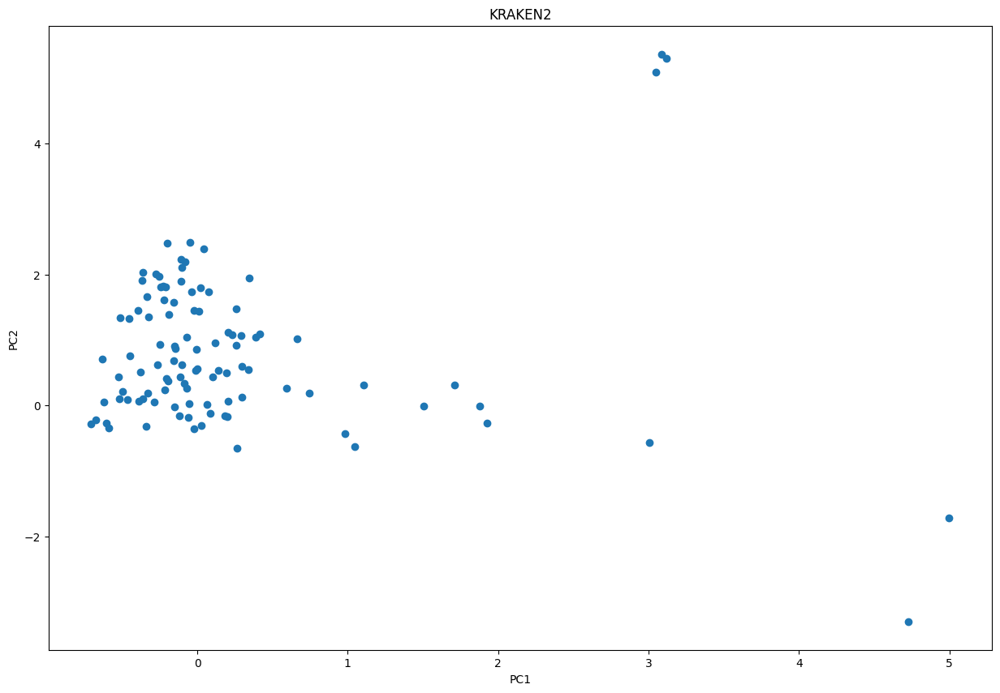

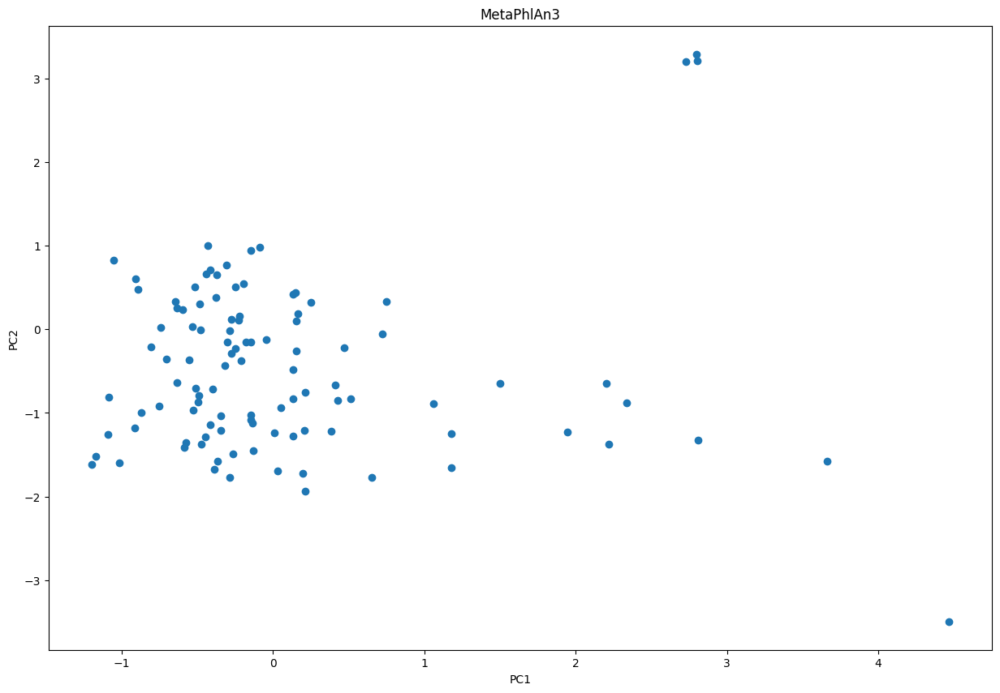

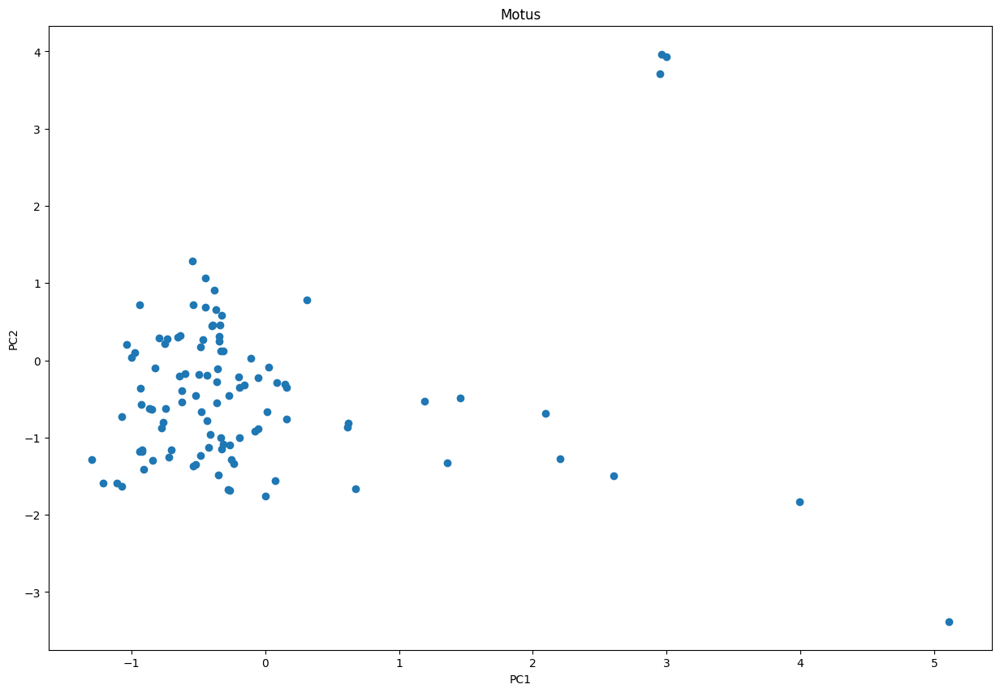

In [40]:
for file in os.listdir(os.getcwd()):
    if 'pca_common' in file:
        df = pd.read_csv(Path(os.getcwd())/file)
        plt.figure(figsize=(15, 10))
        plt.scatter(x=df['PC1'], y=df['PC2'])
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.title(f'{file.split("_")[0]}')
        plt.show()

## Mahalanobis distance

In [41]:
df_mahalanobis = pd.DataFrame()
for pair in combinations(['Cosmos', 'KRAKEN2', 'FOCUS', 'MetaPhlAn3', 'Motus'], 2):
    software1_pca_coordinates = pd.read_csv(f'{pair[0]}_pca_common_taxids.csv', index_col=0)
    software2_pca_coordinates = pd.read_csv(f'{pair[1]}_pca_common_taxids.csv', index_col=0)
    distances = np.diag(cdist(software1_pca_coordinates.values, software2_pca_coordinates.values, 'mahalanobis'))
    df_mahalanobis[f'{pair[0]}-{pair[1]}'] = distances
df_mahalanobis.head(10)
# df_mahalanobis.to_csv('mahalanobis.csv')

,Cosmos-KRAKEN2,Cosmos-FOCUS,Cosmos-MetaPhlAn3,Cosmos-Motus,KRAKEN2-FOCUS,KRAKEN2-MetaPhlAn3,KRAKEN2-Motus,FOCUS-MetaPhlAn3,FOCUS-Motus,MetaPhlAn3-Motus
0,0.417852,0.860762,0.674810,0.708204,1.102073,1.068498,1.109802,0.596125,0.664388,0.084250
1,0.271782,1.236648,0.944950,0.881054,1.493568,1.167032,1.178173,0.346851,0.710451,0.458314
2,0.424940,1.962451,0.765968,0.553677,2.547907,1.256333,1.004027,1.682874,1.866753,0.538956
3,0.382417,1.483347,0.763652,0.850769,1.886714,1.087766,1.217860,0.936529,0.816856,0.241205
4,0.525397,0.521600,0.911272,0.491755,1.118812,1.512817,1.054473,0.685452,0.035102,0.638303
5,0.379325,1.768704,0.991106,0.535716,2.302890,1.312074,0.894917,1.466827,1.679506,0.605295
6,0.488028,2.258574,0.881496,0.699248,2.681018,1.193927,1.089350,1.789749,1.989502,0.317204
7,0.670564,0.416342,0.248290,0.414870,1.098900,0.712935,0.514903,0.454647,0.771732,0.312425
8,0.408470,1.905036,1.218085,0.902525,2.285524,0.888987,0.637503,2.557804,1.705384,0.720470
9,0.188643,1.158544,0.574463,0.370659,1.352771,0.814333,0.578791,1.376519,1.187556,0.299852


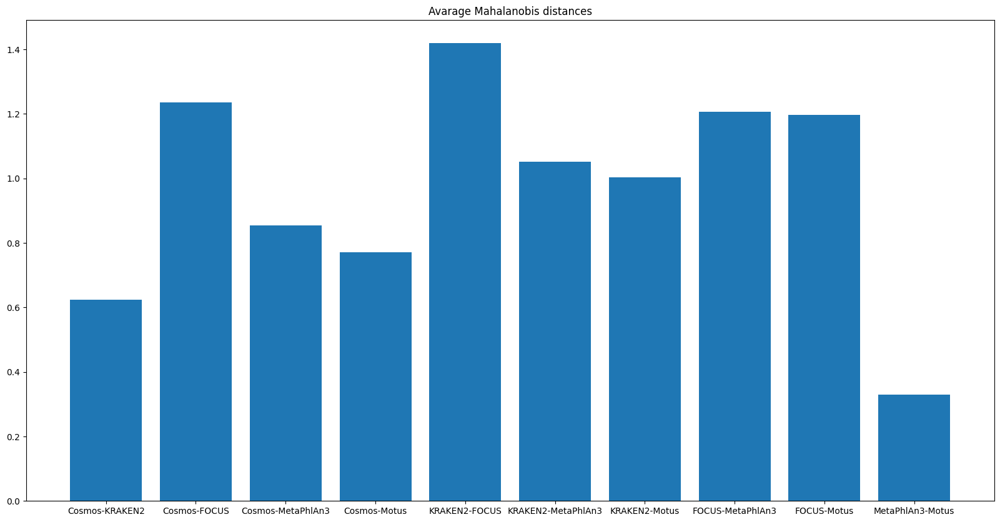

In [42]:
fig = plt.figure(figsize = (20, 10))
plt.bar(df_mahalanobis.columns, df_mahalanobis.mean())
plt.title('Avarage Mahalanobis distances')
plt.show()